In [ ]:
from sqlalchemy import create_engine, text
import numpy as np
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt

engine = create_engine("path")

# Seller Level Analysis

In [29]:
query6 = text(
    """
    select * from orders o
    left join order_items oi on o.order_id = oi.order_id
    left join sellers s on oi.seller_id = s.seller_id
    """
)

df6 = pd.read_sql(query6,engine)

# removing duplicate seller_id column
df6 = df6.loc[:, ~df6.columns.duplicated()]
df6

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,seller_zip_code_prefix,seller_city,seller_state
0,00010242fe8c5a6d1ba2dd792cb16214,3ce436f183e68e07877b285a838db11a,delivered,2017-09-13 08:59:02,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29,1.0,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29,27277.0,volta redonda,SP
1,00018f77f2f0320c557190d7a144bdd3,f6dd3ec061db4e3987629fe6b26e5cce,delivered,2017-04-26 10:53:06,2017-04-26 11:05:13,2017-05-04 14:35:00,2017-05-12 16:04:24,2017-05-15,1.0,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93,3471.0,sao paulo,SP
2,000229ec398224ef6ca0657da4fc703e,6489ae5e4333f3693df5ad4372dab6d3,delivered,2018-01-14 14:33:31,2018-01-14 14:48:30,2018-01-16 12:36:48,2018-01-22 13:19:16,2018-02-05,1.0,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87,37564.0,borda da mata,MG
3,00024acbcdf0a6daa1e931b038114c75,d4eb9395c8c0431ee92fce09860c5a06,delivered,2018-08-08 10:00:35,2018-08-08 10:10:18,2018-08-10 13:28:00,2018-08-14 13:32:39,2018-08-20,1.0,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79,14403.0,franca,SP
4,00042b26cf59d7ce69dfabb4e55b4fd9,58dbd0b2d70206bf40e62cd34e84d795,delivered,2017-02-04 13:57:51,2017-02-04 14:10:13,2017-02-16 09:46:09,2017-03-01 16:42:31,2017-03-17,1.0,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14,87900.0,loanda,PR
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113420,fffc94f6ce00a00581880bf54a75a037,b51593916b4b8e0d6f66f2ae24f2673d,delivered,2018-04-23 13:57:06,2018-04-25 04:11:01,2018-04-25 12:09:00,2018-05-10 22:56:40,2018-05-18,1.0,4aa6014eceb682077f9dc4bffebc05b0,b8bc237ba3788b23da09c0f1f3a3288c,2018-05-02 04:11:01,299.99,43.41,88303.0,itajai,SC
113421,fffcd46ef2263f404302a634eb57f7eb,84c5d4fbaf120aae381fad077416eaa0,delivered,2018-07-14 10:26:46,2018-07-17 04:31:48,2018-07-17 08:05:00,2018-07-23 20:31:55,2018-08-01,1.0,32e07fd915822b0765e448c4dd74c828,f3c38ab652836d21de61fb8314b69182,2018-07-20 04:31:48,350.00,36.53,1206.0,sao paulo,SP
113422,fffce4705a9662cd70adb13d4a31832d,29309aa813182aaddc9b259e31b870e6,delivered,2017-10-23 17:07:56,2017-10-24 17:14:25,2017-10-26 15:13:14,2017-10-28 12:22:22,2017-11-10,1.0,72a30483855e2eafc67aee5dc2560482,c3cfdc648177fdbbbb35635a37472c53,2017-10-30 17:14:25,99.90,16.95,80610.0,curitiba,PR
113423,fffe18544ffabc95dfada21779c9644f,b5e6afd5a41800fdf401e0272ca74655,delivered,2017-08-14 23:02:59,2017-08-15 00:04:32,2017-08-15 19:02:53,2017-08-16 21:59:40,2017-08-25,1.0,9c422a519119dcad7575db5af1ba540e,2b3e4a2a3ea8e01938cabda2a3e5cc79,2017-08-21 00:04:32,55.99,8.72,4733.0,sao paulo,SP


In [30]:
pivot_df = pd.pivot_table(df6,index="seller_id",columns="order_status",values="order_id",aggfunc="nunique",fill_value=0)
pivot_df.sort_values(by=["delivered"],ascending=False)

order_status,approved,canceled,delivered,invoiced,processing,shipped,unavailable
seller_id,,,,,,,
6560211a19b47992c3666cc44a7e94c0,0,7,1819,3,0,25,0
4a3ca9315b744ce9f8e9374361493884,0,2,1772,1,0,31,0
cc419e0650a3c5ba77189a1882b7556a,0,9,1651,7,0,39,0
1f50f920176fa81dab994f9023523100,0,1,1399,0,0,4,0
da8622b14eb17ae2831f4ac5b9dab84a,0,0,1311,0,0,3,0
...,...,...,...,...,...,...,...
15aec03fe4cf30dfa574cf550f5ff5ff,0,0,0,0,1,0,0
fec6912baad85d41729669edd6b4d3b8,0,0,0,0,1,0,0
02a2272692e13558373c66db98f05e2e,0,1,0,0,1,0,0


In [31]:
pivot_df = pivot_df.reset_index()
pivot_df["seller_short"] = pivot_df["seller_id"].str[:4]+".."

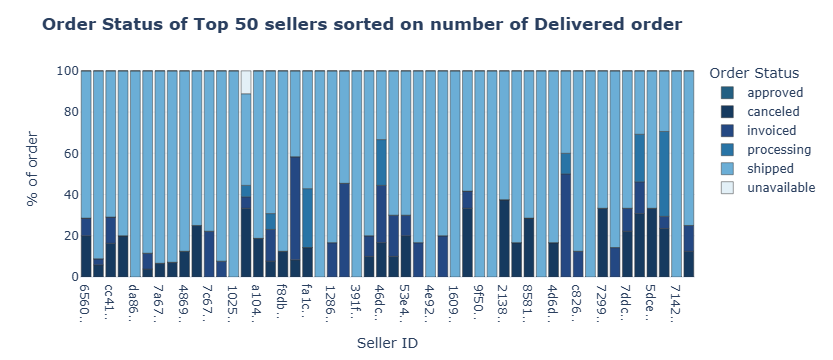

In [66]:
import plotly.express as px
plot_df = pivot_df.sort_values(by=["delivered"],ascending=False).head(50)
color=["#235f82","#163A5F","#244883","#2874A6","#6BAED6","#E3F0F7"]
fig = px.bar(plot_df,x="seller_short",y=["approved","canceled","invoiced","processing","shipped","unavailable"],color_discrete_sequence=color)
fig.update_layout(yaxis_title="% of order",xaxis_title="Seller ID",title_text="<b>Order Status of Top 50 sellers sorted on number of Delivered order</b>",barnorm="percent",template="plotly_white",legend_title_text="Order Status")
fig.update_traces(marker_line_color="#3A3A3A",marker_line_width=0.5)
fig.show(config = {'toImageButtonOptions': {'format': 'png','filename': 'Seller_Order_Analysis','height': 600,'width': 800,'scale': 4}})

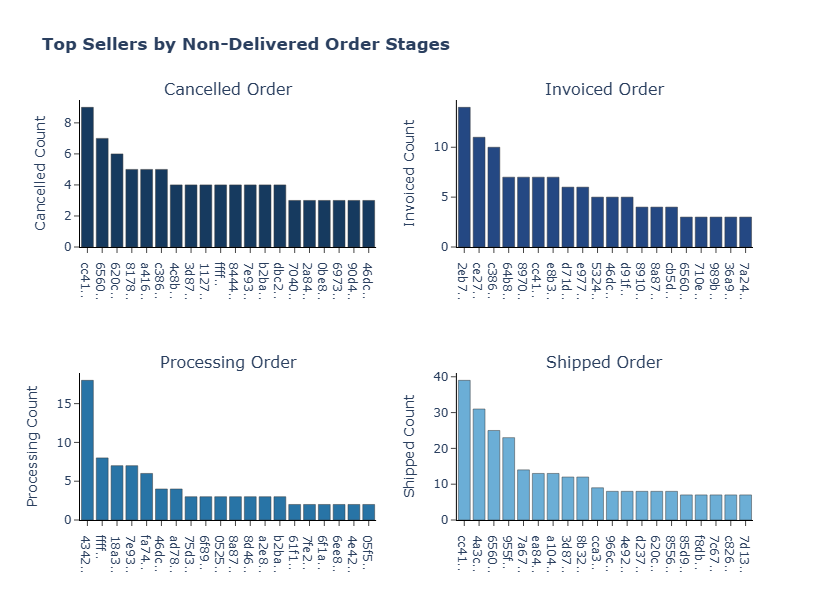

In [68]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

fig = make_subplots(rows=2, cols=2, subplot_titles=("Cancelled Order", "Invoiced Order","Processing Order","Shipped Order"),vertical_spacing=0.30,horizontal_spacing=0.12)

fig.add_trace(go.Bar(x=pivot_df.sort_values(by=['canceled'], ascending=False).head(20).reset_index()['seller_short'],y=pivot_df.sort_values(by=['canceled'], ascending=False).head(20)['canceled']),row=1, col=1)
fig.add_trace(go.Bar(x=pivot_df.sort_values(by=['invoiced'], ascending=False).head(20).reset_index()['seller_short'],y=pivot_df.sort_values(by=['invoiced'], ascending=False).head(20)['invoiced']),row=1, col=2)
fig.add_trace(go.Bar(x=pivot_df.sort_values(by=['processing'], ascending=False).head(20).reset_index()['seller_short'],y=pivot_df.sort_values(by=['processing'], ascending=False).head(20)['processing']),row=2, col=1)
fig.add_trace(go.Bar(x=pivot_df.sort_values(by=['shipped'], ascending=False).head(20).reset_index()['seller_short'],y=pivot_df.sort_values(by=['shipped'], ascending=False).head(20)['shipped']),row=2, col=2)

fig.update_layout(title_text="<b>Top Sellers by Non-Delivered Order Stages</b>",height=600,width=800,showlegend=False,template="plotly_white")

fig.update_traces(marker_color="#163A5F",marker_line_color="#3A3A3A",marker_line_width=0.5,row=1,col=1)
fig.update_traces(marker_color="#244883",marker_line_color="#3A3A3A",marker_line_width=0.5,row=1,col=2)
fig.update_traces(marker_color="#2874A6",marker_line_color="#3A3A3A",marker_line_width=0.5,row=2,col=1)
fig.update_traces(marker_color="#6BAED6",marker_line_color="#3A3A3A",marker_line_width=0.5,row=2,col=2)

fig.update_yaxes(title_text="Cancelled Count", row=1, col=1)
fig.update_yaxes(title_text="Invoiced Count", row=1, col=2)
fig.update_yaxes(title_text="Processing Count", row=2, col=1)
fig.update_yaxes(title_text="Shipped Count", row=2, col=2)
fig.update_xaxes(showgrid=False,showline=True,linewidth=1,linecolor="black",ticks="outside")
fig.update_yaxes(showgrid=False,showline=True,linewidth=1,linecolor="black",zeroline=False,ticks="outside")

fig.show(config = {'toImageButtonOptions': {'format': 'png','filename': 'Seller_analysis','height': 600,'width': 800,'scale': 4}})


In [29]:
df7 = df6.groupby("seller_id").agg(Revenue=("price","sum"),Orders = ("order_id",pd.Series.nunique))
df7["AOV"] = np.round(df7["Revenue"]/df7["Orders"],2)
df7 = df7.merge(pivot_df,on="seller_id").drop(columns=["seller_short","approved"])
df7.sort_values("Revenue",ascending=False)

,seller_id,Revenue,Orders,AOV,canceled,delivered,invoiced,processing,shipped,unavailable
857,4869f7a5dfa277a7dca6462dcf3b52b2,229472.63,1132,202.71,1,1124,0,0,7,0
1013,53243585a1d6dc2643021fd1853d8905,222776.05,358,622.28,0,348,5,1,4,0
881,4a3ca9315b744ce9f8e9374361493884,200472.92,1806,111.00,2,1772,1,0,31,0
3024,fa1c13f2614d7b5c4749cbc52fecda94,194042.03,585,331.70,1,578,0,2,4,0
1535,7c67e1448b00f6e969d365cea6b010ab,187923.89,982,191.37,0,973,2,0,7,0
...,...,...,...,...,...,...,...,...,...,...
627,34aefe746cd81b7f3b23253ea28bef39,8.00,1,8.00,0,0,0,1,0,0
1370,702835e4b785b67a084280efca355756,7.60,1,7.60,0,1,0,0,0,0
373,1fa2d3def6adfa70e58c276bb64fe5bb,6.90,1,6.90,0,1,0,0,0,0
1465,77128dec4bec4878c37ab7d6169d6f26,6.50,1,6.50,0,1,0,0,0,0


# Sales & Revenue Analysis

In [30]:
# Total revenue by month

query1 = text("""
        select 
            DATE_FORMAT(o.order_purchase_timestamp,'%Y-%m') as month, 
            sum(oi.price) as revenue 
        from orders o
        left join order_items oi on o.order_id = oi.order_id
        where order_status = 'delivered'
        group by DATE_FORMAT(o.order_purchase_timestamp,'%Y-%m')
        order by month
        """)

df1 = pd.read_sql(query1,engine)
df1

,month,revenue
0,2016-09,134.97
1,2016-10,40325.11
2,2016-12,10.90
3,2017-01,111798.36
4,2017-02,234223.40
5,2017-03,359198.85
6,2017-04,340669.68
7,2017-05,489338.25
8,2017-06,421923.37
9,2017-07,481604.52


In [31]:
# Revenue contribution by product category

query2 = text("""
        select 
            t.product_category_name_english as product_category, 
            sum(price) as revenue from order_items oi
        left join products p on oi.product_id = p.product_id
        left join product_category_name_translation t on p.product_category_name = t.product_category_name
        left join orders o on o.order_id = oi.order_id
        where o.order_status = 'delivered'
        group by t.product_category_name_english
        order by revenue desc
        """)

df2 = pd.read_sql(query2,engine)
df2

,product_category,revenue
0,health_beauty,1233131.72
1,watches_gifts,1166176.98
2,bed_bath_table,1023434.76
3,sports_leisure,954852.55
4,computers_accessories,888724.61
...,...,...
69,flowers,1110.04
70,home_comfort_2,760.27
71,cds_dvds_musicals,730.00
72,fashion_childrens_clothes,519.95


In [28]:
# Average order value and by category.

query3 = text("""
        select 
            t.product_category_name_english as product_category,
            count(distinct oi.order_id) as total_orders,
            sum(price) as revenue from order_items oi
        left join products p on oi.product_id = p.product_id
        left join product_category_name_translation t on p.product_category_name = t.product_category_name
        left join orders o on o.order_id = oi.order_id
        where o.order_status = 'delivered'
        group by t.product_category_name_english
        order by revenue desc
        """)

df3 = pd.read_sql(query3,engine)
df3["AOV_category"] = df3["revenue"]/df3["total_orders"]
df3.sort_values(by="AOV_category",ascending=False,inplace=True)
df3

,product_category,total_orders,revenue,AOV_category
16,computers,177,218684.14,1235.503616
35,small_appliances_home_oven_and_coffee,72,46589.56,647.077222
26,home_appliances_2,227,107953.95,475.568062
29,agro_industry_and_commerce,177,70566.10,398.678531
62,kitchen_portables_and_food_preparators,13,3933.63,302.586923
...,...,...,...,...
21,electronics,2517,155043.93,61.598701
71,cds_dvds_musicals,12,730.00,60.833333
67,diapers_and_hygiene,25,1500.79,60.031600
69,flowers,29,1110.04,38.277241


In [29]:
avg_aov = df3["AOV_category"].mean()
comp_aov = 1235.503616
print(round(comp_aov / avg_aov, 1))

7.6


In [30]:
box_categories = df3[(df3["total_orders"] >= 4500) & (df3["total_orders"] <= 11000)]
box_categories.sort_values("revenue", ascending=False)

,product_category,total_orders,revenue,AOV_category
0,health_beauty,8647,1233131.72,142.608040
1,watches_gifts,5495,1166176.98,212.225110
2,bed_bath_table,9272,1023434.76,110.379072
3,sports_leisure,7530,954852.55,126.806448
4,computers_accessories,6530,888724.61,136.098715
5,furniture_decor,6307,711927.69,112.878974
6,housewares,5743,615628.69,107.196359


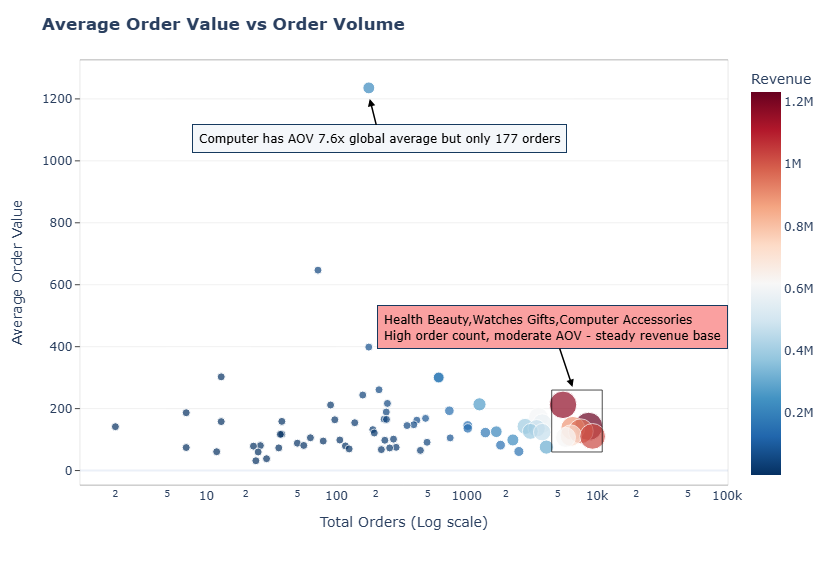

In [31]:
fig = px.scatter(df3,x="total_orders",y="AOV_category",size=df3["revenue"],log_x=True,hover_data=["revenue","product_category"],color="revenue",color_continuous_scale="Rdbu_r")
fig.update_traces(marker={"sizemin":4})
fig.update_layout(template="plotly_white",title_text="<b>Average Order Value vs Order Volume</b>",coloraxis_colorbar_title="Revenue",width=960,
    height=550)
fig.update_xaxes(title="Total Orders (Log scale)",showgrid=False,showline=True, linewidth=0.3, linecolor='#000000', mirror=True)
fig.update_yaxes(title="Average Order Value",showline=True, linewidth=0.1, linecolor='#000000', mirror=True,showgrid=True,gridcolor="#E5E5E5",gridwidth=0.6,ticks="outside")
fig.add_shape(type="rect",xref="x", yref="y",x0=4500, y0=60, x1=11000, y1=260,line_color="black",line_width=0.7)
fig.add_annotation(x=np.log10(6500),y=270,text="Health Beauty,Watches Gifts,Computer Accessories<br>High order count, moderate AOV - steady revenue base",
showarrow=True,arrowhead=2,font={"size":12,"color":"black"},arrowcolor="black",ax=-20, ay=-60,arrowsize=1,arrowwidth=1.5,align="left",bordercolor="#163A5F",borderwidth=1,borderpad=6,bgcolor="#FAA0A0")
fig.add_annotation(x=np.log10(180),y=1200,text="Computer has AOV 7.6x global average but only 177 orders",showarrow=True,arrowhead=2,font={"size":12,"color":"black"},arrowcolor="black",ax=10, ay=40,arrowsize=1,arrowwidth=1.5,align="left",bordercolor="#163A5F",borderwidth=1,borderpad=6,bgcolor="#F4F7FA")
fig.show(config = {'toImageButtonOptions': {'format': 'png','filename': 'Category_analysis','scale': 4 }})

In [152]:
query_true_aov = text("""
    select 
        t.product_category_name_english as product_category,
        o.order_id,
        (select sum(oi2.price) from order_items oi2 where oi2.order_id = o.order_id) as full_order_value
    from order_items oi
    left join products p on oi.product_id = p.product_id
    left join product_category_name_translation t on p.product_category_name = t.product_category_name
    left join orders o on o.order_id = oi.order_id
    where o.order_status = 'delivered'
""")
df_true = pd.read_sql(query_true_aov, engine)
df_true_dedup = df_true.drop_duplicates(["product_category","order_id"])  # avoid double counting if category has multiple items in the order

true_aov_by_cat = df_true_dedup.groupby("product_category")["full_order_value"].mean().reset_index(name="true_AOV_category")

In [155]:
true_aov_by_cat.sort_values("true_AOV_category",ascending=False)

,product_category,true_AOV_category
14,computers,1235.943164
66,small_appliances_home_oven_and_coffee,647.077222
45,home_appliances_2,475.752643
0,agro_industry_and_commerce,398.678531
57,musical_instruments,302.903912
...,...,...
26,electronics,62.952447
11,cds_dvds_musicals,60.833333
23,diapers_and_hygiene,60.031600
35,flowers,42.713103


In [50]:
# Freight value as % of total order value trend over time.
query4 = text("""
                Select * from order_items oi
                left join orders o on oi.order_id = o.order_id
                where o.order_status = 'delivered'
            """)

df4 = pd.read_sql(query4, engine)
df4["freight_value_pct"] = df4["freight_value"]/(df4["price"] + df4["freight_value"]) * 100
df4["month-year"] = pd.to_datetime(df4["order_purchase_timestamp"]).dt.to_period("M")
df4

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,freight_value_pct,month-year
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29,00010242fe8c5a6d1ba2dd792cb16214,3ce436f183e68e07877b285a838db11a,delivered,2017-09-13 08:59:02,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29,18.409752,2017-09
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93,00018f77f2f0320c557190d7a144bdd3,f6dd3ec061db4e3987629fe6b26e5cce,delivered,2017-04-26 10:53:06,2017-04-26 11:05:13,2017-05-04 14:35:00,2017-05-12 16:04:24,2017-05-15,7.670400,2017-04
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87,000229ec398224ef6ca0657da4fc703e,6489ae5e4333f3693df5ad4372dab6d3,delivered,2018-01-14 14:33:31,2018-01-14 14:48:30,2018-01-16 12:36:48,2018-01-22 13:19:16,2018-02-05,8.239959,2018-01
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79,00024acbcdf0a6daa1e931b038114c75,d4eb9395c8c0431ee92fce09860c5a06,delivered,2018-08-08 10:00:35,2018-08-08 10:10:18,2018-08-10 13:28:00,2018-08-14 13:32:39,2018-08-20,49.612102,2018-08
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14,00042b26cf59d7ce69dfabb4e55b4fd9,58dbd0b2d70206bf40e62cd34e84d795,delivered,2017-02-04 13:57:51,2017-02-04 14:10:13,2017-02-16 09:46:09,2017-03-01 16:42:31,2017-03-17,8.319574,2017-02
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
110192,fffc94f6ce00a00581880bf54a75a037,1,4aa6014eceb682077f9dc4bffebc05b0,b8bc237ba3788b23da09c0f1f3a3288c,2018-05-02 04:11:01,299.99,43.41,fffc94f6ce00a00581880bf54a75a037,b51593916b4b8e0d6f66f2ae24f2673d,delivered,2018-04-23 13:57:06,2018-04-25 04:11:01,2018-04-25 12:09:00,2018-05-10 22:56:40,2018-05-18,12.641235,2018-04
110193,fffcd46ef2263f404302a634eb57f7eb,1,32e07fd915822b0765e448c4dd74c828,f3c38ab652836d21de61fb8314b69182,2018-07-20 04:31:48,350.00,36.53,fffcd46ef2263f404302a634eb57f7eb,84c5d4fbaf120aae381fad077416eaa0,delivered,2018-07-14 10:26:46,2018-07-17 04:31:48,2018-07-17 08:05:00,2018-07-23 20:31:55,2018-08-01,9.450754,2018-07
110194,fffce4705a9662cd70adb13d4a31832d,1,72a30483855e2eafc67aee5dc2560482,c3cfdc648177fdbbbb35635a37472c53,2017-10-30 17:14:25,99.90,16.95,fffce4705a9662cd70adb13d4a31832d,29309aa813182aaddc9b259e31b870e6,delivered,2017-10-23 17:07:56,2017-10-24 17:14:25,2017-10-26 15:13:14,2017-10-28 12:22:22,2017-11-10,14.505777,2017-10
110195,fffe18544ffabc95dfada21779c9644f,1,9c422a519119dcad7575db5af1ba540e,2b3e4a2a3ea8e01938cabda2a3e5cc79,2017-08-21 00:04:32,55.99,8.72,fffe18544ffabc95dfada21779c9644f,b5e6afd5a41800fdf401e0272ca74655,delivered,2017-08-14 23:02:59,2017-08-15 00:04:32,2017-08-15 19:02:53,2017-08-16 21:59:40,2017-08-25,13.475506,2017-08


In [51]:
df4["freight_value_pct"].mean()

np.float64(21.348271494453382)

In [52]:
freight_df = df4.groupby("month-year").agg(freight=("freight_value","sum"),revenue=("price","sum")).reset_index()
freight_df["freight_pct"] = (freight_df["freight"] /(freight_df["revenue"] + freight_df["freight"])) * 100
freight_df["month-year"] = freight_df["month-year"].astype(str)

In [53]:
freight_df

,month-year,freight,revenue,freight_pct
0,2016-09,8.49,134.97,5.918026
1,2016-10,6165.55,40325.11,13.261911
2,2016-12,8.72,10.90,44.444444
3,2017-01,15684.01,111798.36,12.302885
4,2017-02,37015.92,234223.40,13.646959
5,2017-03,55132.10,359198.85,13.306295
6,2017-04,50142.72,340669.68,12.830381
7,2017-05,77513.15,489338.25,13.674333
8,2017-06,68127.00,421923.37,13.902040
9,2017-07,84694.56,481604.52,14.955800


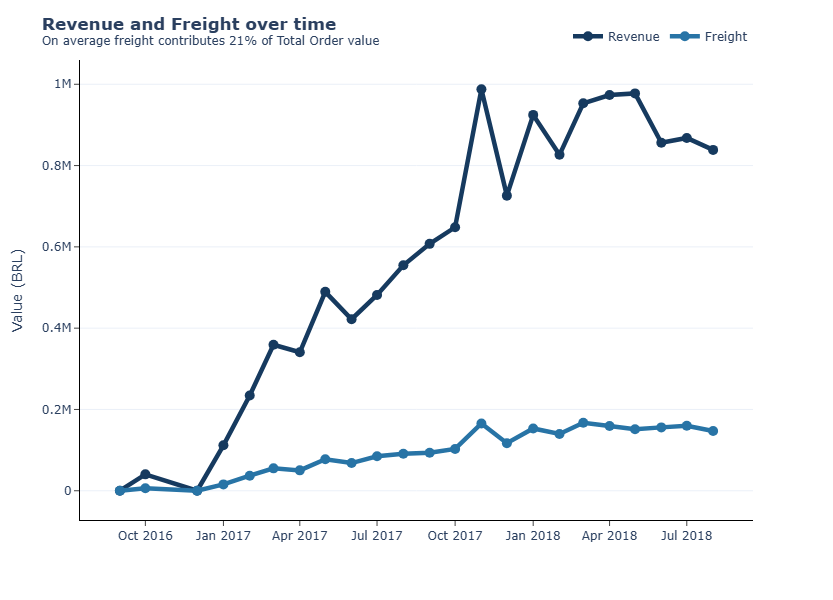

In [62]:
freight_df["month-year"] = freight_df["month-year"].astype(str)
fig = px.line(freight_df,x="month-year",y=["revenue","freight"],markers=True)
fig.update_layout(template="plotly_white",legend_title_text="",title_text="<b>Revenue and Freight over time</b><br><sup>On average freight contributes 21% of Total Order value</sup>",legend={"orientation":"h","yanchor":"bottom","y":1.02,"xanchor":"right","x":1},height=600,width=800)
fig.update_traces(line_color='#163A5F',name="Revenue",line_width=4.5,marker_size=10,selector={"name":"revenue"})
fig.update_traces(line_color='#2874A6',name="Freight",line_width=4.5,marker_size=10,selector={"name":"freight"})

fig.update_xaxes(title_text="",showgrid=False,showline=True,linewidth=1,linecolor="black",ticks="outside")
fig.update_yaxes(title_text="Value (BRL)",showgrid=True,showline=True,linewidth=1,linecolor="black",zeroline=False,ticks="outside")

fig.show(config = {
  'toImageButtonOptions': {
    'format': 'png',
    'filename': 'Revenue_and_Freight_over_time',
    'scale': 4
  }
})

In [69]:
# Nov 2017 timeline

query_nov = text(
            """
            with cte as (select order_items.price,orders.order_purchase_timestamp from order_items
            left join orders on order_items.order_id = orders.order_id
            where (orders.order_status = 'delivered') AND (DATE_FORMAT(orders.order_purchase_timestamp, '%m-%Y') = '11-2017') )
            select 
                Day(order_purchase_timestamp) as day,
                Hour(order_purchase_timestamp) as hour,
                Sum(price) as revenue
            from cte
            GROUP BY day,hour
            """
            )
df_nov = pd.read_sql(query_nov,engine)

In [91]:
pivot_nov = pd.pivot_table(df_nov,index="hour",columns="day",values="revenue",aggfunc="first",fill_value=0)

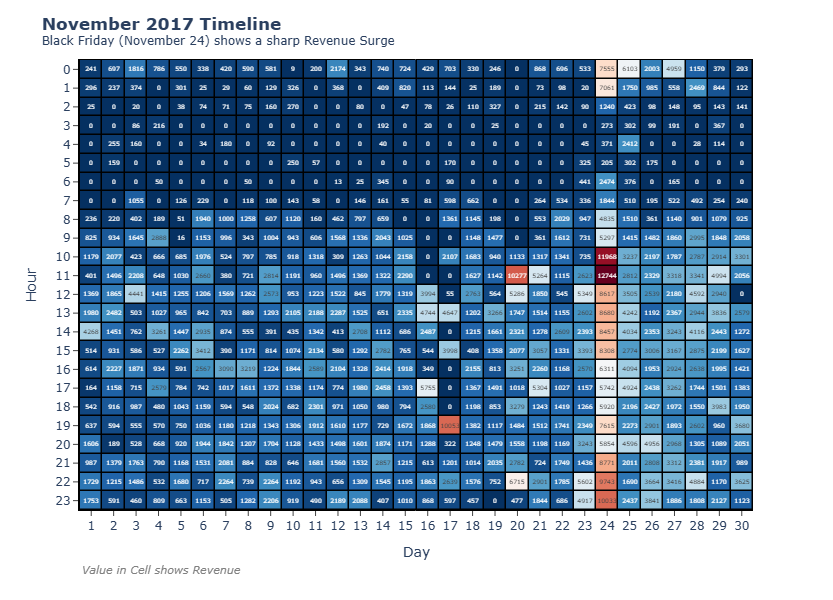

In [115]:
fig = px.imshow(pivot_nov,aspect="auto",color_continuous_scale="RdBu_r",text_auto=".0f")
fig.update_traces(xgap=1.5, ygap=1.5)
fig.update_xaxes(showgrid=False, zeroline=False,linewidth=1, linecolor='black',mirror=True,type="category",tickmode="linear",dtick=1,ticks="outside")
fig.update_yaxes(showgrid=False, zeroline=False,linewidth=2, linecolor='black',type="category",tickmode="linear",dtick=1,ticks="outside")
fig.update_layout(template="plotly_white",width=800,height=600,title="<b>November 2017 Timeline</b><br><sup>Black Friday (November 24) shows a sharp Revenue Surge</sup>",plot_bgcolor="black",xaxis_title="Day",yaxis_title="Hour",coloraxis_showscale=False,margin={"b":90})
fig.add_annotation(text="<i>Value in Cell shows Revenue</i>",xref="paper",yref="paper",x=0,y=-0.15,showarrow=False,font={"color":"gray","size":11})
fig.show(config={"toImageButtonOptions": {"format": "png","filename": "Nov2017_timeline","scale": 4 }})

In [32]:
# Average items per order

query5 = text(
        """
        select * from order_items
        """
        )

df5 = pd.read_sql(query5,engine)
number_item_df = df5.groupby(["order_id"]).agg(number_of_unique_item=("product_id",pd.Series.nunique),number_of_item=("order_item_id","count")).reset_index().sort_values("number_of_item",ascending=False)

In [33]:
number_item_df.head(5)

,order_id,number_of_unique_item,number_of_item
50137,8272b63d03f5f79c56e9e4120aec44ef,3,21
10459,1b15974a0141d54e36626dca3fdc731a,1,20
65715,ab14fdcfbe524636d65ee38360e22ce8,1,20
60941,9ef13efd6949e4573a18964dd1bbe7f5,1,15
25583,428a2f660dc84138d969ccd69a0ab6d5,1,15


In [34]:
number_item_df.mean(numeric_only=True)

number_of_unique_item    1.038098
number_of_item           1.141731
dtype: float64

In [35]:
single_vs_multi = (number_item_df["number_of_item"] == 1).value_counts(normalize=True) * 100
print(single_vs_multi)
# True = single item %, False = multi-item %

number_of_item
True     90.06446
False     9.93554
Name: proportion, dtype: float64


In [36]:
# Within multi-item orders, split into "bulk" (same product) vs "basket" (different products)
multi = number_item_df[number_item_df["number_of_item"] > 1].copy()
multi["type"] = multi.apply(lambda x: "bulk_same_product" if x["number_of_unique_item"] == 1 else "mixed_basket",axis=1)
multi["type"].value_counts(normalize=True) * 100

type
bulk_same_product    66.989697
mixed_basket         33.010303
Name: proportion, dtype: float64

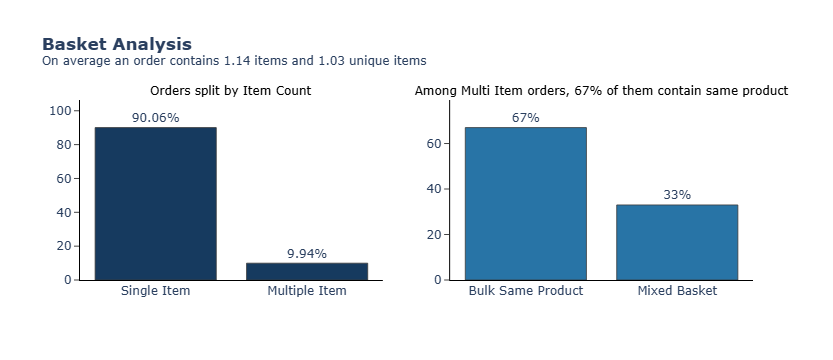

In [37]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

fig = make_subplots(rows=1, cols=2,subplot_titles=["Orders split by Item Count","Among Multi Item orders, 67% of them contain same product"])

fig.add_trace(go.Bar(x=["Single Item","Multiple Item"],y=[90.06,9.94],text=["90.06%","9.94%"],textposition="outside",
                     marker_color="#163A5F"
                    ),
              row=1,col=1)
fig.add_trace(go.Bar(x=["Bulk Same Product","Mixed Basket"],y=[67,33],text=["67%","33%"],textposition="outside",
                     marker_color="#2874A6"
                    ),
              row=1,col=2)
fig.update_layout(template="plotly_white",showlegend=False,title="<b>Basket Analysis</b><br><sup>On average an order contains 1.14 items and 1.03 unique items</sup>",margin=dict(t=100))
fig.update_traces(marker_line_color="#3A3A3A",marker_line_width=0.8,cliponaxis=False)
fig.update_xaxes(showgrid=False,showline=True,linewidth=1,linecolor="black")
fig.update_yaxes(showgrid=False,showline=True,linewidth=1,linecolor="black",zeroline=False,ticks="outside")

fig.layout["annotations"][0]["font"]={"color":"black"}
fig.layout["annotations"][1]["font"]={"color":"black"}
fig.show(config = {'toImageButtonOptions': {'format': 'png','filename': 'Basket_Analysis','scale': 4}})

In [22]:
# co-occurrence matrix
query6 = text(
        """
        Select oi.order_id, pt.product_category_name_english from order_items oi
        left join products p on oi.product_id = p.product_id
        left join product_category_name_translation pt on p.product_category_name = pt.product_category_name
        """
        )
df6 = pd.read_sql(query6,engine)
df6

,order_id,product_category_name_english
0,f30149f4a8882a08895b6a242aa0d612,perfumery
1,f5eda0ded77c1293b04c953138c8331d,auto
2,0bf736fd0fd5169d60de3699fcbcf986,bed_bath_table
3,3aba44d8e554ab4bb8c09f6f78032ca8,housewares
4,6f0dfb5b5398b271cc6bbd9ee263530e,housewares
...,...,...
112645,a8159270bc9cf7d54450e079ba6b7232,computers_accessories
112646,beaf95465b542dea76df78b2fb86a97a,computers_accessories
112647,d6c1ed12e8eeaa15e9d5c83c79598f85,computers_accessories
112648,dd38c566a34ff9deb93ff05d7bd6d0aa,computers_accessories


In [23]:
temp_df = df6.drop_duplicates(["order_id","product_category_name_english"])
temp_df2 = pd.pivot_table(temp_df,index="order_id",columns="product_category_name_english",values="product_category_name_english",aggfunc="count",fill_value=0)

In [24]:
matrix = temp_df2.T@temp_df2
matrix

product_category_name_english,agro_industry_and_commerce,air_conditioning,art,arts_and_craftmanship,audio,auto,baby,bed_bath_table,books_general_interest,books_imported,...,security_and_services,signaling_and_security,small_appliances,small_appliances_home_oven_and_coffee,sports_leisure,stationery,tablets_printing_image,telephony,toys,watches_gifts
product_category_name_english,,,,,,,,,,,,,,,,,,,,,
agro_industry_and_commerce,182,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
air_conditioning,0,253,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
art,0,0,202,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
arts_and_craftmanship,0,0,0,23,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
audio,0,0,0,0,350,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
stationery,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,1,2311,0,0,6,2
tablets_printing_image,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,79,0,0,0
telephony,0,0,0,0,0,3,0,0,0,0,...,0,0,1,0,0,0,0,4199,1,2


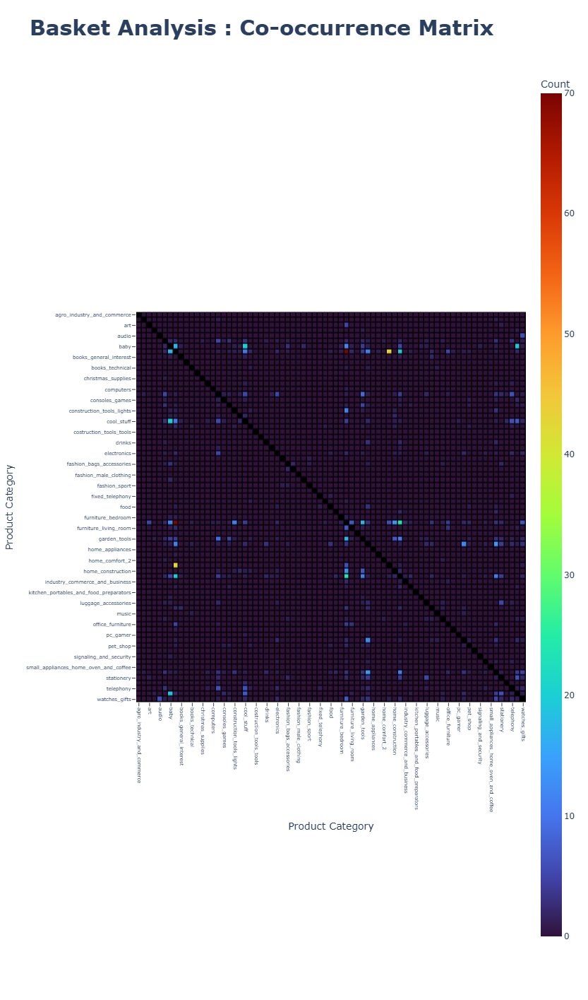

In [25]:
fig = px.imshow(matrix.mask(np.eye(73,dtype="bool"),np.nan), color_continuous_scale="Turbo",title="<b>Basket Analysis : Co-occurrence Matrix</b>")

fig.update_layout(width=1400, height=1400, template="plotly_white",
    xaxis=dict(tickangle=90, tickfont=dict(size=7)),
    yaxis=dict(tickfont=dict(size=7)),
    margin=dict(t=100),
    coloraxis_colorbar_title_text = "Count",
    title_font_size = 30,
    xaxis_title_text="Product Category",
    yaxis_title_text="Product Category",
    plot_bgcolor="black"
    )
fig.update_yaxes(showgrid=False,ticks="outside")
fig.update_xaxes(showgrid=False,ticks="outside")
fig.update_traces(xgap=1.5, ygap=1.5)
fig.show(config = {'toImageButtonOptions': {'format': 'png','filename': 'Co-occurrence Matrix','scale': 4}})

In [26]:
matrix.index.name="category_1"
matrix.columns.name="category_2"
tempdf = matrix.stack().reset_index().rename(columns={0:"Co-occurrence_Count"}).sort_values("Co-occurrence_Count",ascending=False)
tempdf2 = tempdf[tempdf["category_1"] != tempdf["category_2"]]
tempdf2["category_list"]=tempdf2.apply(lambda x : sorted([x["category_1"],x["category_2"]]),axis=1)
tempdf2.drop_duplicates("category_list",inplace=True)
tempdf2.drop(columns=["category_list"],inplace=True)
tempdf2

,category_1,category_2,Co-occurrence_Count
2854,furniture_decor,bed_bath_table,70
558,bed_bath_table,home_confort,43
2896,furniture_decor,housewares,24
3584,housewares,bed_bath_table,20
1466,cool_stuff,baby,20
...,...,...,...
288,arts_and_craftmanship,tablets_printing_image,0
5034,stationery,telephony,0
5033,stationery,tablets_printing_image,0
5108,tablets_printing_image,toys,0


In [27]:
print(tempdf2.head(20))

                 category_1                 category_2  Co-occurrence_Count
2854        furniture_decor             bed_bath_table                   70
558          bed_bath_table               home_confort                   43
2896        furniture_decor                 housewares                   24
3584             housewares             bed_bath_table                   20
1466             cool_stuff                       baby                   20
5189                   toys                       baby                   19
3105           garden_tools            furniture_decor                   17
445                    baby             bed_bath_table                   17
4934         sports_leisure              health_beauty                   14
2895        furniture_decor          home_construction                   13
477                    baby            furniture_decor                   12
4496              perfumery              health_beauty                   12
554         

In [135]:
query7 = text(
        """
        select * from order_items oi
        left join orders o on oi.order_id = o.order_id
        where o.order_status <> 'delivered'
        """
        )

df7 = pd.read_sql(query7,engine)

In [136]:
temp = df7.groupby("order_status").agg(revenue_lost=("price","sum"),freight=("freight_value","sum"),number_of_orders=("order_id",pd.Series.nunique)).reset_index().sort_values("revenue_lost",ascending=False)

In [138]:
temp

,order_status,revenue_lost,freight,number_of_orders
4,shipped,150727.44,26401.90,1106
1,canceled,95235.27,10650.45,461
2,invoiced,61526.37,7462.38,312
3,processing,60439.22,8954.89,301
5,unavailable,2007.69,132.80,6
0,approved,209.60,31.48,2


In [141]:
temp["revenue_lost"].sum()/(df1["revenue"].sum()+temp["revenue_lost"].sum())*100

np.float64(2.723332057328725)

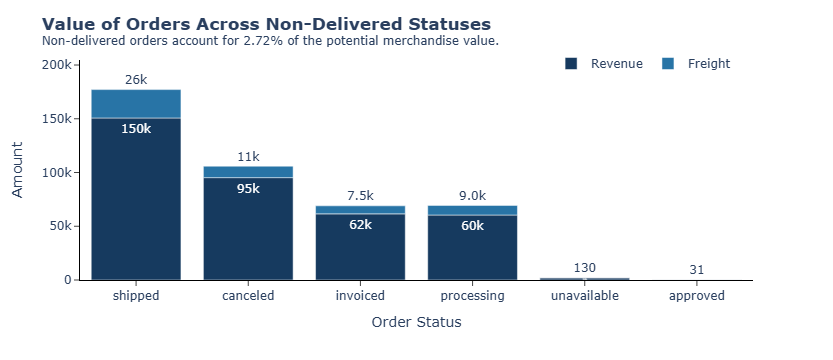

In [143]:
fig = px.bar(temp,x="order_status",y=["revenue_lost","freight"],text_auto=".2s")
fig.update_layout(template="plotly_white",title_text="<b>Value of Orders Across Non-Delivered Statuses</b><br><sup>Non-delivered orders account for 2.72% of the potential merchandise value.",legend_title_text="",xaxis_title_text="Order Status",yaxis_title_text="Amount",legend={"orientation":"h","x":0.7,"y":1.05})
fig.update_traces(textfont_size=12, textangle=0, textposition="outside")
fig.data[0]["marker_color"]="#163A5F"
fig.data[1]["marker_color"]="#2874A6"
fig.update_xaxes(showgrid=False,showline=True,linewidth=1,linecolor="black",ticks="outside")
fig.update_yaxes(showgrid=False,showline=True,linewidth=1,linecolor="black",zeroline=False,ticks="outside")
fig.data[0]["name"] = "Revenue"
fig.data[1]["name"] = "Freight"
fig.show(config = {'toImageButtonOptions': {'format': 'png','filename': 'Non_Delivered_Order_Value','width':900,'height':550,'scale': 4}})

# Customer Analysis

In [7]:
# Total unique customers and repeat customers

query8 = text(
            """
            select * from orders
            left join customers on orders.customer_id = customers.customer_id
            where orders.order_status = 'delivered'
            """
        )

df8 = pd.read_sql(query8,engine)

In [8]:
temp8 = df8.groupby("customer_unique_id").agg(number_of_order=("order_id","nunique")).reset_index().sort_values("number_of_order",ascending=False)

In [9]:
kpis = pd.Series({"Unique Customers": temp8["customer_unique_id"].nunique(),
                  "Repeat Customers": (temp8["number_of_order"] > 1).sum(),
                  "Repeat Customer Rate (%)": (temp8["number_of_order"] > 1).sum()/temp8["customer_unique_id"].nunique() * 100,
                  "Average Orders per Customer":temp8["number_of_order"].mean(),
                  "Max Orders by a Customer":temp8["number_of_order"].max()
                }
            )

print(kpis)

Unique Customers               93358.000000
Repeat Customers                2801.000000
Repeat Customer Rate (%)           3.000278
Average Orders per Customer        1.033420
Max Orders by a Customer          15.000000
dtype: float64


In [10]:
temp8["number_of_order"].value_counts().reset_index()

,number_of_order,count
0,1,90557
1,2,2573
2,3,181
3,4,28
4,5,9
5,6,5
6,7,3
7,15,1
8,9,1


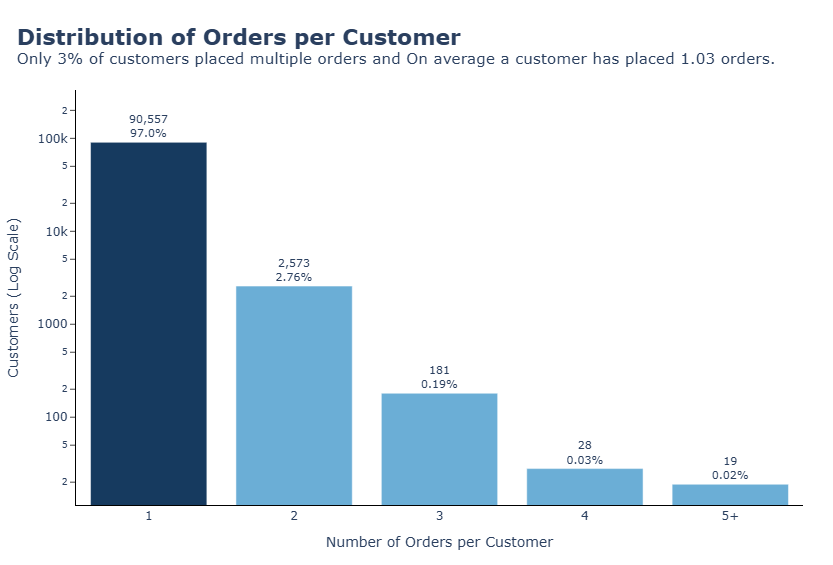

In [11]:
plot_df = temp8.copy()
plot_df["order_bucket"] = np.where(plot_df["number_of_order"] >= 5,"5+",plot_df["number_of_order"].astype(str))
order = ["1", "2", "3", "4", "5+"]
plot_df = plot_df.groupby("order_bucket").size().reindex(order).reset_index(name="customers")
plot_df["percentage"] = (plot_df["customers"] /plot_df["customers"].sum()) * 100
plot_df["label"] = plot_df["customers"].map("{:,}".format)+ "<br>"+ plot_df["percentage"].round(2).astype(str)+ "%"
colors=["#163A5F" if x == "1" else "#6BAED6" for x in plot_df["order_bucket"]]

fig = px.bar(plot_df,x="order_bucket",y="customers",text="label",log_y=True)

fig.update_layout(template="plotly_white",width=900,height=550,showlegend=False,margin=dict(t=90, l=70, r=30, b=60),
    title={
        "text": "<b>Distribution of Orders per Customer</b><br><sup>Only 3% of customers placed multiple orders and On average a customer has placed 1.03 orders.</sup>",
        "x": 0.02,
        "font": {"size": 22}
    },
    xaxis_title="Number of Orders per Customer",
    yaxis_title="Customers (Log Scale)"
)

fig.update_traces(textposition="outside",textfont_size=11,cliponaxis=False,marker_color=colors)
fig.update_xaxes(showgrid=False,showline=True,linewidth=1,linecolor="black")
fig.update_yaxes(showgrid=False,showline=True,linewidth=1,linecolor="black",ticks="outside")

fig.show(config={"toImageButtonOptions": {
                    "format": "png",
                    "filename": "Customer_Order_Distribution",
                    "scale": 4 }
})

In [13]:
# New customer acquisition trend by month.

query9 = text("""
            select * from orders
            left join customers on orders.customer_id = customers.customer_id
            """)

df9 = pd.read_sql(query9,engine)
df9["order_purchase_timestamp"] = pd.to_datetime(df9["order_purchase_timestamp"])
temp9 = df9.sort_values("order_purchase_timestamp").drop_duplicates(subset="customer_unique_id",keep="first")
temp9["Month"] = temp9["order_purchase_timestamp"].dt.strftime("%b-%Y")
temp9_2 = temp9.groupby("Month").agg(New_customer_count=("customer_unique_id","count")).sort_index(key=lambda x: pd.to_datetime(x, format="%b-%Y"))

In [14]:
temp9_2

,New_customer_count
Month,
Sep-2016,4
Oct-2016,321
Dec-2016,1
Jan-2017,764
Feb-2017,1752
Mar-2017,2636
Apr-2017,2352
May-2017,3596
Jun-2017,3139


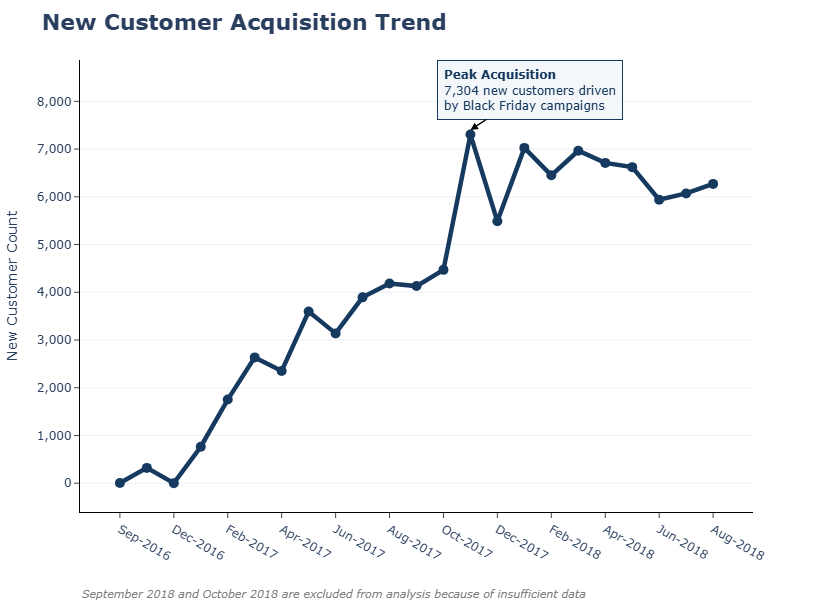

In [21]:
plot_df = temp9_2.iloc[:-2,:].reset_index()

fig = px.line(plot_df,x="Month",y="New_customer_count",markers=True)
fig.update_layout(template="plotly_white",title_text="<b>New Customer Acquisition Trend</b>",title_font_size=22,height=600,width=800)
fig.update_traces(line_width=4.5,line_color="#163A5F",marker_size=10)
fig.update_xaxes(title_text="",showgrid=False,showline=True,linewidth=1,linecolor="black",ticks="outside",tickmode="array",tickvals=plot_df["Month"][::2],ticktext=plot_df["Month"][::2])
fig.update_yaxes(title_text= "New Customer Count",showgrid=True,showline=True,linewidth=1,linecolor="black",ticks="outside",zeroline=False,tickformat=",")

fig.add_annotation(x="Nov-2017",y=7400,
    text="<b>Peak Acquisition</b><br>7,304 new customers driven<br>by Black Friday campaigns",
    font=dict(color="#163A5F", size=12),showarrow=True,arrowhead=2,arrowsize=1,arrowwidth=1.5,arrowcolor="#000000",
    ax=60,ay=-40,align="left",bordercolor="#163A5F",borderwidth=1,borderpad=6,bgcolor="#F4F7FA")

fig.add_annotation(text="<i>September 2018 and October 2018 are excluded from analysis because of insufficient data</i>",xref="paper",yref="paper",x=0,y=-0.2,showarrow=False,font={"color":"gray","size":11})

fig.show(config={"toImageButtonOptions": {
                    "format": "png",
                    "filename": "Acquisition_Trend",
                    "scale": 4 }})

# Geographic Analysis

In [152]:
# ARPU by state

query_arpu = text("""
            select 
                o.customer_id, 
                oi.order_id, 
                oi.price,
                c.customer_unique_id, 
                c.customer_state 
            from order_items oi
            left join orders o on oi.order_id = o.order_id
            left join customers c on o.customer_id = c.customer_id
            where o.order_status = 'delivered'
        """)

df_arpu = pd.read_sql(query_arpu,engine)

In [153]:
summary = df_arpu.groupby("customer_state").agg(revenue=("price","sum"),customers=("customer_unique_id","nunique"),orders=("order_id","nunique"))

In [154]:
summary["ARPU"] = summary["revenue"]/summary["customers"]
summary["AOV"] = summary["revenue"]/summary["orders"]

In [155]:
summary=summary.reset_index()
summary.sort_values("revenue",ascending=False)

,customer_state,revenue,customers,orders,ARPU,AOV
25,SP,5067633.16,39156,40501,129.421625,125.123655
18,RJ,1759651.13,11917,12350,147.658902,142.481873
10,MG,1552481.83,11001,11354,141.121883,136.734352
22,RS,728897.47,5168,5345,141.040532,136.369966
17,PR,666063.51,4769,4923,139.665236,135.296264
23,SC,507012.13,3449,3546,147.002647,142.981424
4,BA,493584.14,3158,3256,156.296434,151.592181
6,DF,296498.41,2019,2080,146.854091,142.547312
8,GO,282836.70,1895,1957,149.254195,144.525652
7,ES,268643.45,1928,1995,139.337889,134.658371


In [156]:
import plotly.express as px
import json
from urllib.request import urlopen


with urlopen("https://raw.githubusercontent.com/codeforamerica/click_that_hood/master/public/data/brazil-states.geojson") as response:
    brazil_geojson = json.load(response)

for feature in brazil_geojson["features"]:
    feature["id"] = feature["properties"]["sigla"]

# Approximate centroid lat/lon for each Brazilian state (abbreviation: [lat, lon])
state_centroids = {
    "AC": [-9.0238, -70.812], "AL": [-9.5713, -36.782], "AP": [1.410, -51.770],
    "AM": [-3.417, -65.858], "BA": [-12.578, -41.703], "CE": [-5.498, -39.320],
    "DF": [-15.780, -47.930], "ES": [-19.187, -40.308], "GO": [-15.827, -49.836],
    "MA": [-4.962, -45.274], "MT": [-12.644, -55.421], "MS": [-20.771, -54.786],
    "MG": [-18.512, -44.555], "PA": [-3.792, -52.480], "PB": [-7.280, -36.724],
    "PR": [-24.890, -51.554], "PE": [-8.813, -36.951], "PI": [-7.720, -42.729],
    "RJ": [-22.906, -43.172], "RN": [-5.795, -36.590], "RS": [-30.032, -53.418],
    "RO": [-10.940, -62.826], "RR": [1.999, -61.330], "SC": [-27.242, -50.213],
    "SP": [-22.190, -48.792], "SE": [-10.577, -37.371], "TO": [-10.171, -48.298]
}

In [157]:
summary["lat"] = summary["customer_state"].map(lambda s: state_centroids[s][0])
summary["lon"] = summary["customer_state"].map(lambda s: state_centroids[s][1])
summary

,customer_state,revenue,customers,orders,ARPU,AOV,lat,lon
0,AC,15930.97,76,80,209.618026,199.137125,-9.0238,-70.812
1,AL,78855.72,387,397,203.761550,198.629018,-9.5713,-36.782
2,AM,22155.84,140,145,158.256000,152.798897,-3.4170,-65.858
3,AP,13374.81,66,67,202.648636,199.624030,1.4100,-51.770
4,BA,493584.14,3158,3256,156.296434,151.592181,-12.5780,-41.703
5,CE,219757.38,1258,1279,174.687901,171.819687,-5.4980,-39.320
6,DF,296498.41,2019,2080,146.854091,142.547312,-15.7800,-47.930
7,ES,268643.45,1928,1995,139.337889,134.658371,-19.1870,-40.308
8,GO,282836.70,1895,1957,149.254195,144.525652,-15.8270,-49.836
9,MA,117009.38,700,717,167.156257,163.192999,-4.9620,-45.274


In [ ]:
fig = px.choropleth(summary, geojson=brazil_geojson, locations="customer_state", color="ARPU",color_continuous_scale="RdBu_r", scope="south america",title="<b>ARPU by State</b>")

fig.add_scattergeo(lon=summary["lon"], lat=summary["lat"],
    text=summary["customer_state"],
    mode="text",
    textfont=dict(size=12, color="black"),
    showlegend=False,
    hoverinfo="skip"
)

fig.update_geos(fitbounds="locations", visible=False, projection_scale=1.6)
fig.update_layout(template="plotly_white", height=650, width=900,margin={"t":50,"b":10,"l":10,"r":10},coloraxis_colorbar_len=0.6,coloraxis_colorbar_thickness=15)
fig.show(config={"toImageButtonOptions": {"format": "png", "filename": "ARPU_by_state", "scale": 4}})

In [ ]:
fig = px.choropleth(summary, geojson=brazil_geojson, locations="customer_state", color="revenue",color_continuous_scale="RdBu_r", scope="south america",title="<b>Revenue by State</b>")

fig.add_scattergeo(lon=summary["lon"], lat=summary["lat"],
    text=summary["customer_state"],
    mode="text",
    textfont=dict(size=12, color="black"),
    showlegend=False,
    hoverinfo="skip"
)

fig.update_geos(fitbounds="locations", visible=False, projection_scale=1.6)
fig.update_layout(template="plotly_white", height=650, width=900,margin={"t":50,"b":10,"l":10,"r":10},coloraxis_colorbar_len=0.6,coloraxis_colorbar_thickness=15)
fig.show(config={"toImageButtonOptions": {"format": "png", "filename": "Revenue_by_state", "scale": 4}})

In [ ]:
fig = px.choropleth(summary, geojson=brazil_geojson, locations="customer_state", color="orders",color_continuous_scale="RdBu_r", scope="south america",title="<b>Order Volume by State</b>")

fig.add_scattergeo(lon=summary["lon"], lat=summary["lat"],
    text=summary["customer_state"],
    mode="text",
    textfont=dict(size=12, color="black"),
    showlegend=False,
    hoverinfo="skip"
)

fig.update_geos(fitbounds="locations", visible=False, projection_scale=1.6)
fig.update_layout(template="plotly_white", height=650, width=900,margin={"t":50,"b":10,"l":10,"r":10},coloraxis_colorbar_len=0.6,coloraxis_colorbar_thickness=15)
fig.show(config={"toImageButtonOptions": {"format": "png", "filename": "Orders_by_state", "scale": 4}})

In [ ]:
fig = px.choropleth(summary, geojson=brazil_geojson, locations="customer_state", color="AOV",color_continuous_scale="RdBu_r", scope="south america",title="<b>AOV by State</b>")

fig.add_scattergeo(lon=summary["lon"], lat=summary["lat"],
    text=summary["customer_state"],
    mode="text",
    textfont=dict(size=12, color="black"),
    showlegend=False,
    hoverinfo="skip"
)

fig.update_geos(fitbounds="locations", visible=False, projection_scale=1.6)
fig.update_layout(template="plotly_white", height=650, width=900,margin={"t":50,"b":10,"l":10,"r":10},coloraxis_colorbar_len=0.6,coloraxis_colorbar_thickness=15)
fig.show(config={"toImageButtonOptions": {"format": "png", "filename": "AOV_by_state", "scale": 4}})

In [ ]:
fig = px.choropleth(summary, geojson=brazil_geojson, locations="customer_state", color="customers",color_continuous_scale="RdBu_r", scope="south america",title="<b>Customers by State</b><br><sup>Two-thirds of  Buyers belong to the SP, RJ and MG State</sup>")

fig.add_scattergeo(lon=summary["lon"], lat=summary["lat"],
    text=summary["customer_state"],
    mode="text",
    textfont=dict(size=12, color="black"),
    showlegend=False,
    hoverinfo="skip"
)

fig.update_geos(fitbounds="locations", visible=False, projection_scale=1.6)
fig.update_layout(template="plotly_white", height=650, width=900,margin={"t":50,"b":10,"l":10,"r":10},coloraxis_colorbar_len=0.6,coloraxis_colorbar_thickness=15)
fig.show(config={"toImageButtonOptions": {"format": "png", "filename": "Customer_by_state", "scale": 4}})

In [165]:
query_seller = text("""
            select  
                oi.order_id,
                o.order_status,
                s.*
            from order_items oi
            left join orders o on oi.order_id = o.order_id
            left join sellers s on oi.seller_id = s.seller_id
        """)

df_seller = pd.read_sql(query_seller,engine)

In [166]:
temp_seller=df_seller.groupby("seller_state").agg(seller_count=("seller_id","nunique")).reset_index()
temp_seller["lat"] = temp_seller["seller_state"].map(lambda s: state_centroids[s][0])
temp_seller["lon"] = temp_seller["seller_state"].map(lambda s: state_centroids[s][1])
temp_seller

,seller_state,seller_count,lat,lon
0,AC,1,-9.0238,-70.812
1,AM,1,-3.4170,-65.858
2,BA,19,-12.5780,-41.703
3,CE,13,-5.4980,-39.320
4,DF,30,-15.7800,-47.930
5,ES,23,-19.1870,-40.308
6,GO,40,-15.8270,-49.836
7,MA,1,-4.9620,-45.274
8,MG,244,-18.5120,-44.555
9,MS,5,-20.7710,-54.786


In [ ]:
fig = px.choropleth(temp_seller, geojson=brazil_geojson, locations="seller_state", color="seller_count",color_continuous_scale="RdBu_r", scope="south america",title="<b>Sellers by State</b><br><sup>60% of Seller belong to the São Paulo</sup>")

fig.add_scattergeo(lon=temp_seller["lon"], lat=temp_seller["lat"],
    text=temp_seller["seller_state"],
    mode="text",
    textfont=dict(size=12, color="black"),
    showlegend=False,
    hoverinfo="skip"
)

fig.update_geos(fitbounds="locations", visible=False, projection_scale=1.6)
fig.update_layout(template="plotly_white", height=650, width=900,margin={"t":50,"b":10,"l":10,"r":10},coloraxis_colorbar_len=0.6,coloraxis_colorbar_thickness=15)
fig.show(config={"toImageButtonOptions": {"format": "png", "filename": "Seller_by_state", "scale": 4}})

In [169]:
df_seller_2 = df_seller[df_seller["order_status"] == "delivered"]

In [170]:
temp_seller_2 = df_seller_2.groupby("seller_state").agg(orders_delivered=("order_id","nunique")).reset_index()
temp_seller_2["lat"] = temp_seller_2["seller_state"].map(lambda s: state_centroids[s][0])
temp_seller_2["lon"] = temp_seller_2["seller_state"].map(lambda s: state_centroids[s][1])
temp_seller_2

,seller_state,orders_delivered,lat,lon
0,AM,3,-3.417,-65.858
1,BA,550,-12.578,-41.703
2,CE,87,-5.498,-39.320
3,DF,808,-15.780,-47.930
4,ES,310,-19.187,-40.308
5,GO,451,-15.827,-49.836
6,MA,389,-4.962,-45.274
7,MG,7735,-18.512,-44.555
8,MS,49,-20.771,-54.786
9,MT,136,-12.644,-55.421


In [ ]:
fig = px.choropleth(temp_seller_2, geojson=brazil_geojson, locations="seller_state", color="orders_delivered",color_continuous_scale="RdBu_r", scope="south america",title="<b>Orders Fulfilled by Seller State</b><br>",labels={"orders_delivered":"Orders Delivered"})

fig.add_scattergeo(lon=temp_seller_2["lon"], lat=temp_seller_2["lat"],
    text=temp_seller_2["seller_state"],
    mode="text",
    textfont=dict(size=12, color="black"),
    showlegend=False,
    hoverinfo="skip"
)

fig.update_geos(fitbounds="locations", visible=False, projection_scale=1.6)
fig.update_layout(template="plotly_white", height=650, width=900,margin={"t":50,"b":10,"l":10,"r":10},coloraxis_colorbar_len=0.6,coloraxis_colorbar_thickness=15)
fig.show(config={"toImageButtonOptions": {"format": "png", "filename": "Orders_by_seller_state", "scale": 4}})

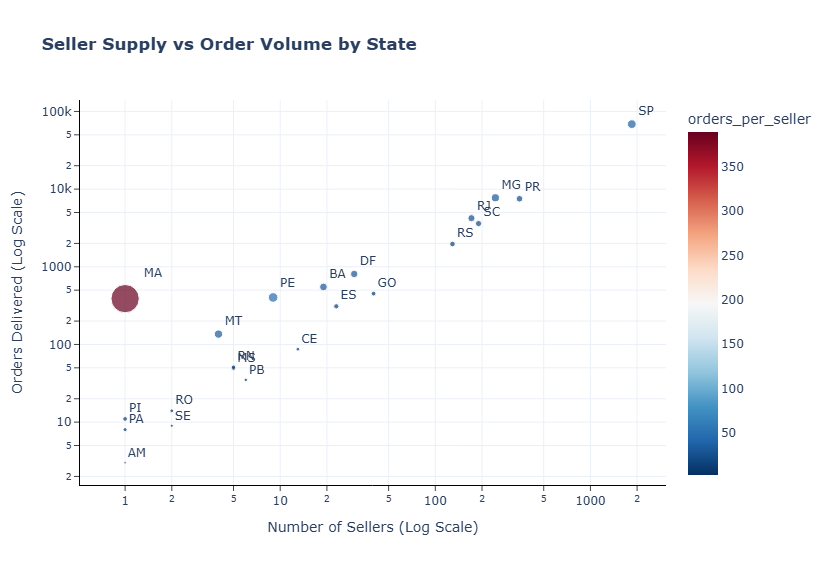

In [172]:
supply_demand = temp_seller[["seller_state","seller_count"]].merge(temp_seller_2[["seller_state","orders_delivered"]], on="seller_state")
supply_demand["orders_per_seller"] = supply_demand["orders_delivered"] / supply_demand["seller_count"]

fig2 = px.scatter(supply_demand, x="seller_count", y="orders_delivered",size="orders_per_seller", color="orders_per_seller",color_continuous_scale="RdBu_r", text="seller_state",
    title="<b>Seller Supply vs Order Volume by State</b>",log_x=True,log_y=True)
fig2.update_traces(textposition="top right")
fig2.update_xaxes(showgrid=True,showline=True,linewidth=1,linecolor="black",ticks="outside")
fig2.update_yaxes(showgrid=True,showline=True,linewidth=1,linecolor="black",ticks="outside")
fig2.update_layout(template="plotly_white", height=550, width=850,xaxis_title="Number of Sellers (Log Scale)", yaxis_title="Orders Delivered (Log Scale)")
fig2.show(config={"toImageButtonOptions": {"format": "png", "filename": "Orders_per_seller_by_state", "scale": 4}})

# Product Analysis

In [25]:
# Best-selling product by volume.
# Best-selling product by revenue.
# Average price by product.
# Product description length vs sales volume correlation
# Photos count (qty) vs conversion/sales correlation

query10 = text("""
        select * from order_items oi
        left join products p on oi.product_id = p.product_id
        left join product_category_name_translation t on p.product_category_name = t.product_category_name
        left join orders o on o.order_id = oi.order_id
        where o.order_status = 'delivered'
        """)
df10 = pd.read_sql(query10,engine)
df10 = df10.loc[:,~df10.columns.duplicated()]

In [26]:
temp10 =  df10.groupby("product_id").agg(
                volume=("order_id","count"),
                revenue=("price","sum"),
                freight=("freight_value","sum"),
                product_category=("product_category_name_english","max"),
                description_length = ("product_description_lenght","max"),
                photos_qty = ("product_photos_qty","max")
        ).reset_index()

temp10["avg_price"] = temp10["revenue"]/temp10["volume"]
temp10["avg_freight"] = temp10["freight"]/temp10["volume"]
temp10["freight %"] = temp10["freight"]/(temp10["revenue"]+temp10["freight"])*100

In [27]:
temp10.sort_values("revenue",ascending=False)

,product_id,volume,revenue,freight,product_category,description_length,photos_qty,avg_price,avg_freight,freight %
23546,bb50f2e236e5eea0100680137654686c,194,63560.00,3698.03,health_beauty,2644.0,6.0,327.628866,19.062010,5.498273
13749,6cdd53843498f92890544667809f1595,153,53652.30,4281.43,health_beauty,625.0,1.0,350.668627,27.983203,7.390220
26997,d6160fb7873f184099d9bc95e30376af,33,45949.35,1364.83,computers,3632.0,4.0,1392.404545,41.358485,2.884611
26436,d1c427060a0f73f6b889a5c7c61f2ac4,332,45620.56,13336.75,computers_accessories,1893.0,1.0,137.411325,40.170934,22.621029
19290,99a4788cb24856965c36a24e339b6058,477,42049.66,7857.84,bed_bath_table,245.0,1.0,88.154423,16.473459,15.744808
...,...,...,...,...,...,...,...,...,...,...
5953,2e8316b31db34314f393806fd7b6e185,1,2.99,11.85,stationery,88.0,1.0,2.990000,11.850000,79.851752
13154,680cc8535be7cc69544238c1d6a83fe8,1,2.90,8.72,pet_shop,1392.0,1.0,2.900000,8.720000,75.043029
17371,8a3254bee785a526d548a81a9bc3c9be,3,2.55,58.76,construction_tools_construction,1041.0,5.0,0.850000,19.586667,95.840809
6250,310dc32058903b6416c71faff132df9e,1,2.29,7.78,stationery,326.0,1.0,2.290000,7.780000,77.259186


In [28]:
temp10[["volume","revenue","avg_price","description_length","photos_qty","avg_freight"]].corr()

,volume,revenue,avg_price,description_length,photos_qty,avg_freight
volume,1.000000,0.704700,-0.032005,0.008046,0.003921,-0.021462
revenue,0.704700,1.000000,0.307337,0.100693,0.027325,0.145142
avg_price,-0.032005,0.307337,1.000000,0.192878,0.058957,0.458120
description_length,0.008046,0.100693,0.192878,1.000000,0.107831,0.100252
photos_qty,0.003921,0.027325,0.058957,0.107831,1.000000,0.053839
avg_freight,-0.021462,0.145142,0.458120,0.100252,0.053839,1.000000


In [131]:
# Category-wise seasonal demand pattern
df10["Month"] = pd.to_datetime(df10["order_purchase_timestamp"]).dt.strftime("%b")
temp10_2 = pd.pivot_table(df10,index="product_category_name_english",columns="Month",values="product_id",aggfunc="count",fill_value=0)
temp10_2

Month,Apr,Aug,Dec,Feb,Jan,Jul,Jun,Mar,May,Nov,Oct,Sep
product_category_name_english,,,,,,,,,,,,
agro_industry_and_commerce,12,22,11,33,21,28,11,28,12,19,5,4
air_conditioning,38,36,3,23,33,22,26,41,21,19,20,7
art,27,22,3,12,19,24,32,11,40,1,3,3
arts_and_craftmanship,1,9,0,0,0,12,0,0,2,0,0,0
audio,42,33,17,20,26,28,31,48,38,36,33,10
...,...,...,...,...,...,...,...,...,...,...,...,...
stationery,187,249,248,164,399,267,205,219,194,163,96,75
tablets_printing_image,12,6,6,21,3,2,7,8,8,6,1,3
telephony,421,403,260,460,390,364,373,499,464,371,252,173


In [132]:
month_order = ["Jan","Feb","Mar","Apr","May","Jun","Jul","Aug","Sep","Oct","Nov","Dec"]
temp10_2 = temp10_2[month_order]
top_categories = df10.groupby("product_category_name_english")["order_id"].nunique().nlargest(20).index
temp10_3 = temp10_2.loc[top_categories]

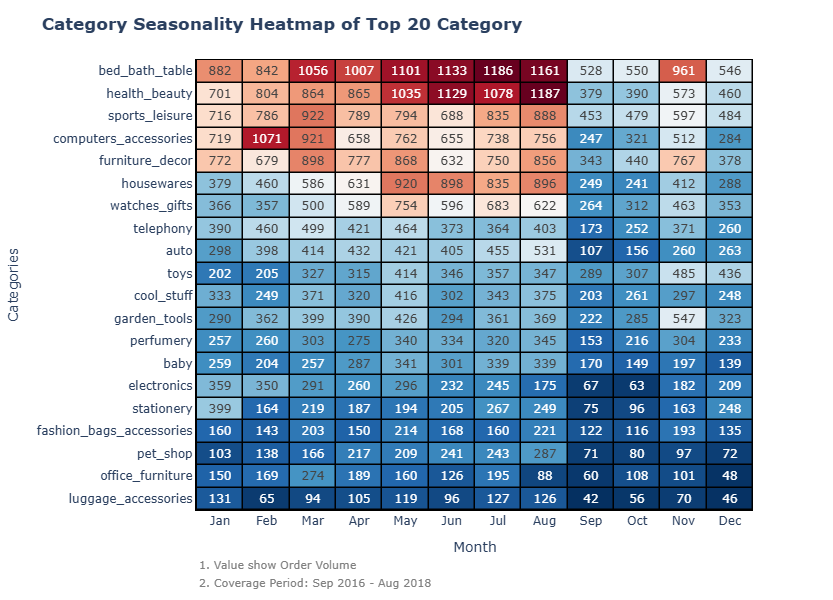

In [133]:
fig = px.imshow(temp10_3,aspect="auto",color_continuous_scale="RdBu_r",text_auto=True)
fig.update_traces(xgap=1.5, ygap=1.5)
fig.update_xaxes(showgrid=False, zeroline=False,linewidth=1, linecolor='black',mirror=True)
fig.update_yaxes(showgrid=False, zeroline=False,linewidth=2, linecolor='black')
fig.update_layout(template="plotly_white",width=800,height=600,title="<b>Category Seasonality Heatmap of Top 20 Category</b>",plot_bgcolor="black",yaxis_title="Categories",coloraxis_showscale=False,margin={"b":90})
fig.add_annotation(text="1. Value show Order Volume",xref="paper",yref="paper",x=0,y=-0.14,showarrow=False,font={"size":11,"color":"gray"},align="left")
fig.add_annotation(text="2. Coverage Period: Sep 2016 - Aug 2018",xref="paper",yref="paper",x=0,y=-0.18,showarrow=False,font={"size":11,"color":"gray"},align="left")
fig.show(config={"toImageButtonOptions": {"format": "png","filename": "Seasonality_Heatmap","scale": 4 }})

# Review Analysis

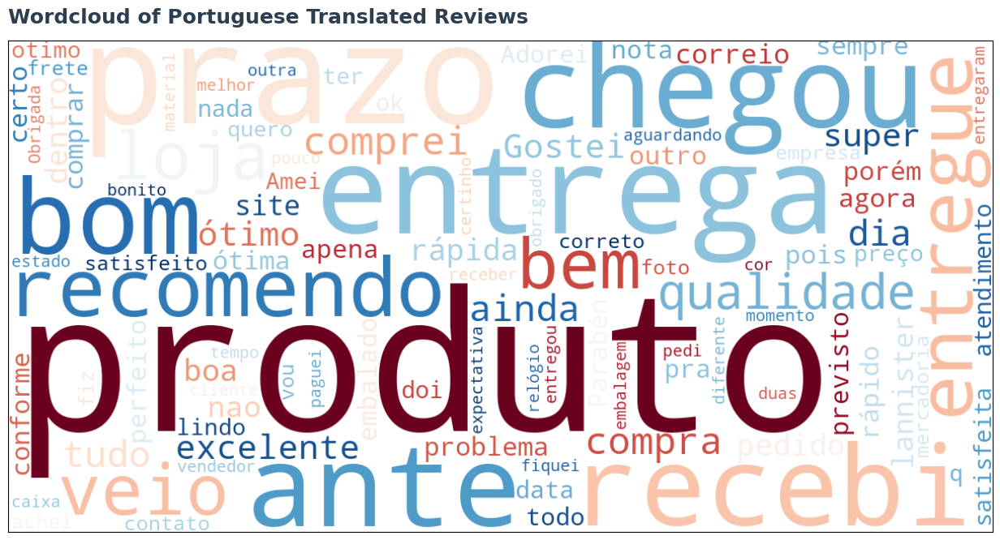

In [20]:
from nltk.corpus import stopwords
from wordcloud import WordCloud

query_portuguese = text("""
            SELECT review_comment_message FROM order_reviews
            WHERE review_comment_message IS NOT NULL
            """)
portuguese_stopwords = set(stopwords.words("portuguese"))
portuguese_stopwords.update(["e", "o", "a", "de", "que", "em", "um", "para", "é", "não", "uma", "os", "com", "no", "isso", "mais"])
df_portuguese = pd.read_sql(query_portuguese,engine)
portuguese_text = " ".join(df_portuguese["review_comment_message"].astype(str))
portuguese_wc = WordCloud(width=1200,height=600,background_color="white",max_words=100,collocations=False,colormap="RdBu_r",stopwords=portuguese_stopwords).generate(portuguese_text)

plt.figure(figsize=(14, 7))
plt.imshow(portuguese_wc, interpolation="bilinear")
plt.title("Wordcloud of Portuguese Translated Reviews",fontsize=18, fontweight='bold', color='#2C3E50', loc='left', pad=15)
plt.tight_layout()
plt.xticks([])
plt.yticks([])
plt.savefig("Portuguese_wordcloud.png",dpi=300,bbox_inches="tight",transparent=False,facecolor="white")
plt.show()

In [ ]:
df_review = pd.read_csv("translated_review_sentiment.csv")

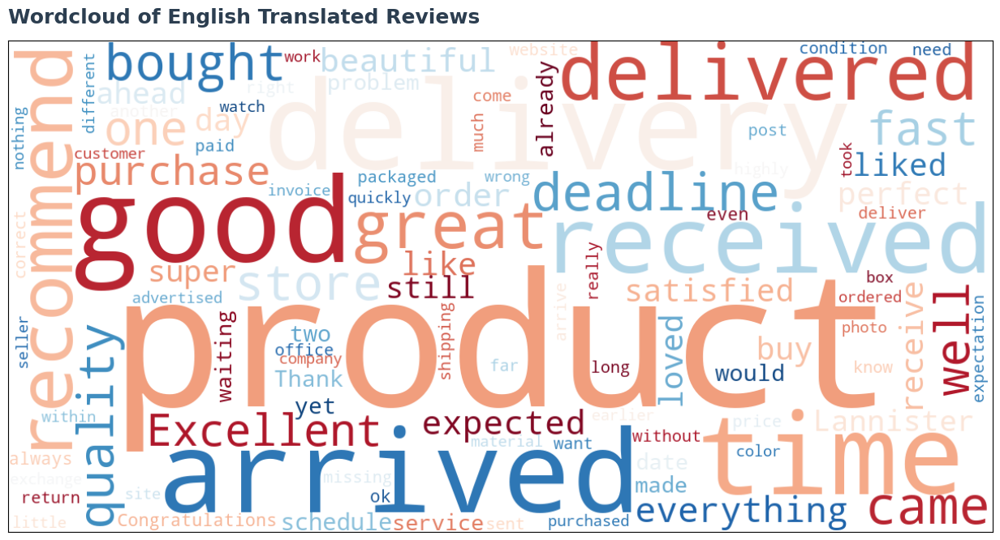

In [24]:
english_stopwords = set(stopwords.words("english"))
english_text = " ".join(df_review["review_comment_message_english"].dropna().astype(str))
english_wc = WordCloud(width=1200,height=600,background_color="white",max_words=100,collocations=False,colormap="RdBu_r",stopwords=english_stopwords).generate(english_text)

plt.figure(figsize=(14, 7))
plt.imshow(english_wc, interpolation="bilinear")
plt.title("Wordcloud of English Translated Reviews",fontsize=18, fontweight='bold', color='#2C3E50', loc='left', pad=15)
plt.tight_layout()
plt.xticks([])
plt.yticks([])
plt.savefig("English_wordcloud.png",dpi=300,bbox_inches="tight",transparent=False,facecolor="white")
plt.show()

In [24]:
df_english = pd.read_csv("olist_order_reviews_dataset_translated.csv")
df_english

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,2018-02-17,2018-02-18 14:36:24
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,NaN,I received it well before the stipulated time.,2017-04-21,2017-04-21 22:02:06
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,NaN,Congratulations Lannister stores I loved shopp...,2018-03-01,2018-03-02 10:26:53
...,...,...,...,...,...,...,...
99995,8968d3a8c57ccf32022a51d20aff3b78,95d9d2979d40161be87292ff88563cba,3,Dissatisfied,I bought 2 melaleuca oil but I received only o...,2018-06-12,2018-06-14 04:10:56
99996,6788adf52f9216eb0dd164c48a52d613,0f503b220e9d1fd78562e41a427a0c6a,3,NaN,I am disappointed with the supplier ... To thi...,2017-10-04,2017-10-04 21:57:37
99997,6eb23c7293216b962df9f33639a98d63,35de4050331c6c644cddc86f4f2d0d64,1,NaN,I have been awaiting the product since Decembe...,2018-01-10,2018-01-10 16:00:48
99998,059052c9d58144d85e0d9204f4a65e6b,1662797f04736ea5acb5de67d5672fcc,3,NaN,This Post Office Delivery System is a crap was...,2018-04-06,2018-04-09 18:22:59


In [93]:
query_portuguese = text("""
            SELECT * FROM order_reviews
            """)
df_portuguese = pd.read_sql(query_portuguese,engine)

In [94]:
df_portuguese

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,0001239bc1de2e33cb583967c2ca4c67,fc046d7776171871436844218f817d7d,5,NaN,NaN,2018-03-20,2018-03-20 18:36:04
1,0001cc6860aeaf5b9017fe4131a52e62,d4665434b01caa9dc3e3e78b3eb3593e,5,NaN,NaN,2018-06-22,2018-06-26 13:51:29
2,00020c7512a52e92212f12d3e37513c0,e28abf2eb2f1fbcbdc2dd0cd9a561671,5,Entrega rápida!,A entrega foi super rápida e o pendente é lind...,2018-04-25,2018-04-26 14:55:36
3,00032b0141443497c898b3093690af51,04fb47576993a3cb0c12d4b25eab6e4e,5,NaN,NaN,2017-05-30,2017-06-01 23:28:55
4,00034d88989f9a4c393bdcaec301537f,5f358d797a49fe2f24352f73426215f6,5,NaN,NaN,2017-08-12,2017-08-13 19:56:53
...,...,...,...,...,...,...,...
99219,fffcfa6087cd3b651c68252342f13cb9,4069c489933782af79afcd3a0e4d693c,4,NaN,NaN,2017-07-14,2017-07-15 02:14:44
99220,fffd24e2cf1ca4ee917e2f05be3c01fb,0efaa1dd18856769a1bcc489004fbe3b,5,NaN,NaN,2017-11-25,2017-11-25 21:23:00
99221,fffd68e8a9fb73a56a2f504011b0f1f1,fceb38f42fbf13b53a6253648c8d47cf,1,NaN,Produto muito ruim.,2017-05-31,2017-06-02 23:21:51
99222,fffee432d53abd67b5b0fd4fc290d8c3,9a54562498faf18f39a0e387976e11a5,5,NaN,NaN,2017-10-25,2017-10-26 08:17:24


In [95]:
review = pd.merge(df_portuguese,df_english,on=["review_id","order_id","review_score"],how="left",suffixes=('_portuguese', '_english'),validate="one_to_one")
review.drop(columns=["review_creation_date_english","review_answer_timestamp_english"],inplace=True)

In [96]:
df_review_count = review.groupby("order_id").agg(review_count=("review_score","count"),review_comment_message=("review_comment_message_portuguese","count"))
count = df_review_count[df_review_count["review_count"]>1].sort_values("review_count",ascending=False)
print(f"{count.shape[0]} Orders has more than one review")

547 Orders has more than one review


In [97]:
def join_text(x):
    x = x.dropna().astype(str).str.strip()
    x = x[x != ""]
    if len(x) == 0:
        return np.nan
    
    return " ".join(x)

In [98]:
review_grouped =review.groupby("order_id").agg(
                review_score=("review_score","mean"),
                review_comment_message_english = ("review_comment_message_english",lambda x: join_text(x))
            )

In [99]:
review_grouped.loc["8e17072ec97ce29f0e1f111e598b0c85","review_comment_message_english"]

'I bought 3 units of the product came 2 units that do not match what I bought. Due to my opinion is negative in relation to this seller because he did not fulfill what was promised in the sale. Delivered the wrong product. Although it delivered on time, it did not send the product I purchased.'

In [100]:
from textblob import TextBlob
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

def text_sentiment(text):
    if pd.isna(text):
        return [np.nan, np.nan]
    result = TextBlob(str(text)).sentiment
    return [result.subjectivity,result.polarity]

analyzer = SentimentIntensityAnalyzer()

In [101]:
review_grouped["sentiment"]=review_grouped["review_comment_message_english"].apply(text_sentiment)
review_grouped["textblob_subjectivity"] = [x[0] for x in review_grouped["sentiment"]]
review_grouped["textblob_polarity"] = [x[1] for x in review_grouped["sentiment"]]
review_grouped["vader_compound"] = review_grouped["review_comment_message_english"].apply(lambda t: analyzer.polarity_scores(str(t))["compound"] if pd.notna(t) else np.nan)

In [102]:
review_grouped.dropna(subset=["review_comment_message_english"])[["review_score","textblob_subjectivity","textblob_polarity","vader_compound"]].corr(method='kendall', numeric_only=True)

,review_score,textblob_subjectivity,textblob_polarity,vader_compound
review_score,1.000000,0.191106,0.432982,0.469155
textblob_subjectivity,0.191106,1.000000,0.460677,0.300689
textblob_polarity,0.432982,0.460677,1.000000,0.545046
vader_compound,0.469155,0.300689,0.545046,1.000000


In [103]:
review_grouped.to_csv("translated_review_sentiment.csv")

In [3]:
df_review = pd.read_csv("translated_review_sentiment.csv")

In [6]:
import unicodedata
import re
def normalize(city):
    normalized = unicodedata.normalize("NFKD", city)
    clean_city = re.sub(r"[-']"," ",normalized.encode("ascii", "ignore").decode("utf-8").strip())
    return clean_city

def haversine(lat1, lon1, lat2, lon2):
    lat1 = np.radians(lat1)
    lon1 = np.radians(lon1)
    lat2 = np.radians(lat2)
    lon2 = np.radians(lon2)
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    a = np.sin(dlat / 2) ** 2+ np.cos(lat1)* np.cos(lat2)* np.sin(dlon / 2) ** 2
    return 2 * 6371 * np.arcsin(np.sqrt(a))

# Removing Outliers
query13 = text(
    """
    select * from geolocation
    where (geolocation_lat Between -33.7509361 and 5.2695815) and (geolocation_lng Between -73.9830601 and -28.8476837)
    """
)
df13 = pd.read_sql(query13,engine)
df13["geolocation_city"] = df13["geolocation_city"].apply(normalize)

def get_mode(x):
    if x.empty:
        return None
    return x.mode().iloc[0]
geolocation_df = df13.groupby("geolocation_zip_code_prefix").agg(geolocation_lat=("geolocation_lat","mean"),geolocation_lng=("geolocation_lng","mean"),geolocation_city=("geolocation_city",get_mode),geolocation_state=("geolocation_state",get_mode))
geolocation_df = geolocation_df.reset_index()

query15 = text("""
        select * from order_items
        left join orders on order_items.order_id = orders.order_id
        left join products on order_items.product_id = products.product_id
        left join customers on orders.customer_id = customers.customer_id
        left join sellers on order_items.seller_id = sellers.seller_id
        """)
df15 = pd.read_sql(query15,engine)
df15 = df15.loc[:, ~df15.columns.duplicated()]

# Count distinct sellers per order
sellers_per_order = df15.groupby("order_id")["seller_id"].nunique()
single_seller_orders = sellers_per_order[sellers_per_order == 1].index
print(f"Total orders: {sellers_per_order.shape[0]}")
print(f"Single-seller orders: {len(single_seller_orders)} ({len(single_seller_orders)/sellers_per_order.shape[0]*100:.2f}%)")

df15_temp = df15[df15["order_id"].isin(single_seller_orders)]
temp_df15 = df15_temp.merge(geolocation_df,left_on="customer_zip_code_prefix",right_on="geolocation_zip_code_prefix").drop(columns=["geolocation_zip_code_prefix","geolocation_city","geolocation_state"])
temp_df15.rename(columns={"geolocation_lat":"customer_lat","geolocation_lng":"customer_lng"},inplace=True)
temp_df15_2 = temp_df15.merge(geolocation_df,left_on="seller_zip_code_prefix",right_on="geolocation_zip_code_prefix").drop(columns=["geolocation_zip_code_prefix","geolocation_city","geolocation_state"])
temp_df15_2.rename(columns={"geolocation_lat":"seller_lat","geolocation_lng":"seller_lng"},inplace=True)


df1 = temp_df15_2.copy()
df1["delivery_days"] = (df1["order_delivered_customer_date"] - df1["order_purchase_timestamp"]).dt.total_seconds()/86400
df1["distance"] = haversine(df1["customer_lat"],df1["customer_lng"],df1["seller_lat"],df1["seller_lng"])

df_summary = df1.groupby("order_id").agg(revenue=("price","sum"),
                           freight=("freight_value","sum"),
                           weight=("product_weight_g","sum"),
                           distance=("distance","first"),
                           delivery_days=("delivery_days","first"),
                           customer_zip_code_prefix=("customer_zip_code_prefix","first"),
                           customer_city=("customer_city","first"),
                           customer_state=("customer_state","first"),
                           seller_zip_code_prefix=("seller_zip_code_prefix","first"),
                           seller_city=("seller_city","first"),
                           seller_state=("seller_state","first"),
                           customer_lng = ("customer_lng","first"),
                           customer_lat = ("customer_lat","first"),
                           seller_lng = ("seller_lng","first"),
                           seller_lat = ("seller_lat","first"),
                           order_status = ("order_status","first"),
                           order_purchase_timestamp =("order_purchase_timestamp","first"),
                           order_delivered_customer_date = ("order_delivered_customer_date","first"),
                           order_estimated_delivery_date = ("order_estimated_delivery_date","first")
                          )

Total orders: 98666
Single-seller orders: 97388 (98.70%)


In [7]:
df_or = pd.merge(df_summary.reset_index(),df_review,on="order_id",how="left",validate="1:1")

In [8]:
df_or = df_or[df_or["order_status"]=="delivered"].copy()
df_or["delay_days"] = (df_or["order_delivered_customer_date"]-df_or["order_estimated_delivery_date"]).dt.total_seconds() / 86400
df_or["is_delayed"] = df_or["delay_days"] >0

In [9]:
df_or["less than 4"] = df_or["review_score"]<4
t = pd.pivot_table(df_or,index="less than 4",columns="is_delayed",values="order_id",aggfunc="count")

In [10]:
t["pct"] = t[True]/(t[False]+t[True])*100
t

is_delayed,False,True,pct
less than 4,,,
False,72600,2787,3.696924
True,14375,4970,25.691393


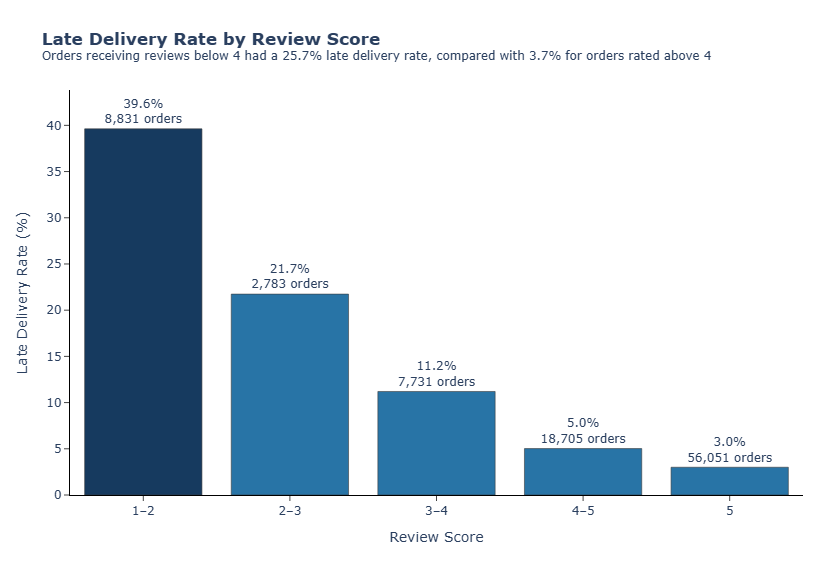

In [11]:
df_or["review_bucket"] = pd.cut(df_or["review_score"],bins=[0.99, 1.99, 2.99, 3.99, 4.99, 5.5],labels=["1–2", "2–3", "3–4", "4–5", "5"],include_lowest=True)

plot_df = df_or.groupby("review_bucket", observed=True).agg(delay_rate=("is_delayed", "mean"),n=("order_id", "count")).reset_index()
plot_df["delay_rate"] *= 100
plot_df["label"] = plot_df["delay_rate"].round(1).astype(str)+ "%<br>"+ plot_df["n"].map("{:,}".format)+ " orders"

fig = px.bar(plot_df,x="review_bucket",y="delay_rate",text="label")
fig.update_traces(texttemplate="%{text}",textposition="outside",cliponaxis=False,marker_color=["#163A5F", "#2874A6", "#2874A6","#2874A6","#2874A6"],marker_line_color="#3A3A3A",marker_line_width=0.6)
fig.update_layout(template="plotly_white",title="<b>Late Delivery Rate by Review Score</b><br><sup>Orders receiving reviews below 4 had a 25.7% late delivery rate, compared with 3.7% for orders rated above 4</sup>",xaxis_title="Review Score",yaxis_title="Late Delivery Rate (%)",width=900,height=550,margin=dict(t=90, l=70, r=30, b=70),showlegend=False)
fig.update_xaxes(showgrid=False,showline=True,linewidth=1,linecolor="black",ticks="outside")
fig.update_yaxes(showgrid=False,showline=True,linewidth=1,linecolor="black",ticks="outside",zeroline=False)

fig.show(config={"toImageButtonOptions": {"format": "png","filename": "Late_delivery_percentage_by_review_score","scale": 4}})

In [12]:
sentiment_analysis = df_or.groupby("review_bucket").agg(
                                orders=("order_id", "count"),
                                textblob_polarity=("textblob_polarity", "mean"),
                                vader_compound=("vader_compound", "mean"),
                                subjectivity=("textblob_subjectivity", "mean")
    ).reset_index()


sentiment_analysis

,review_bucket,orders,textblob_polarity,vader_compound,subjectivity
0,1–2,8831,-0.054272,-0.135599,0.384333
1,2–3,2783,-0.005572,-0.067716,0.405047
2,3–4,7731,0.105729,0.070718,0.425771
3,4–5,18705,0.310732,0.321467,0.475865
4,5,56051,0.465005,0.502635,0.567588


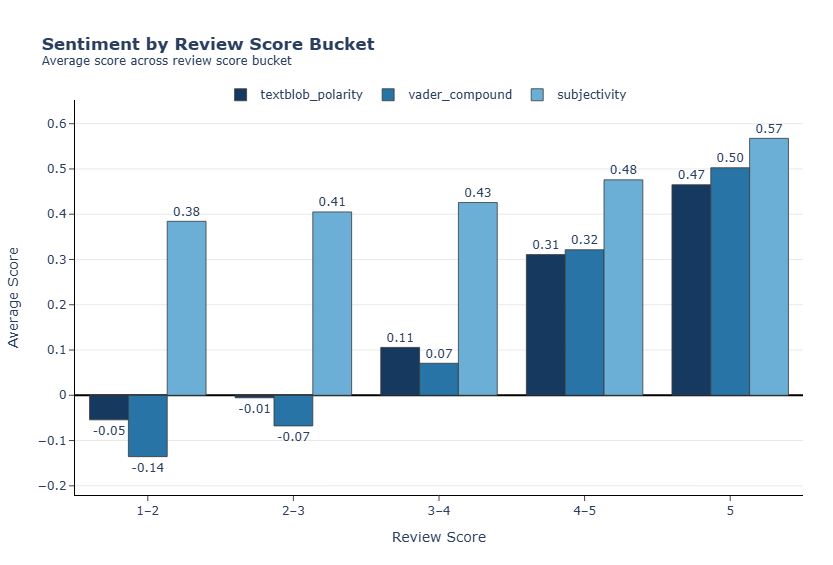

In [13]:
fig = px.bar(sentiment_analysis,x="review_bucket",y=["textblob_polarity", "vader_compound", "subjectivity"],barmode="group",text_auto=".2f",color_discrete_sequence=["#163A5F", "#2874A6", "#6BAED6"],
    title="<b>Sentiment by Review Score Bucket</b><br><sup>Average score across review score bucket",labels={"review_bucket": "Review Score","value": "Average Score","variable": "Sentiment Measure"})

fig.update_layout(template="plotly_white",width=900,height=550,margin=dict(t=100, l=70, r=30, b=70),legend_title_text="",legend={"orientation":"h","y":1.05,"x":0.2})
fig.update_traces(marker_line_color="#3A3A3A",marker_line_width=0.8,textposition="outside",cliponaxis=False)
fig.update_xaxes(showgrid=False,showline=True,linewidth=1,linecolor="black",ticks="outside")
fig.update_yaxes(showgrid=True,gridcolor="lightgrey",gridwidth=0.5,showline=True,linewidth=1,linecolor="black",ticks="outside",zeroline=True,zerolinecolor="black")

fig.show(config={"toImageButtonOptions": {"format": "png","filename": "Sentiment_by_review_bucket","scale": 4}})

In [ ]:
["#163A5F", "#2874A6", "#6BAED6","#6BC9D6","#6BD6AD"]

In [4]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS

df_text = df_review.dropna(subset=["review_comment_message_english"]).copy()

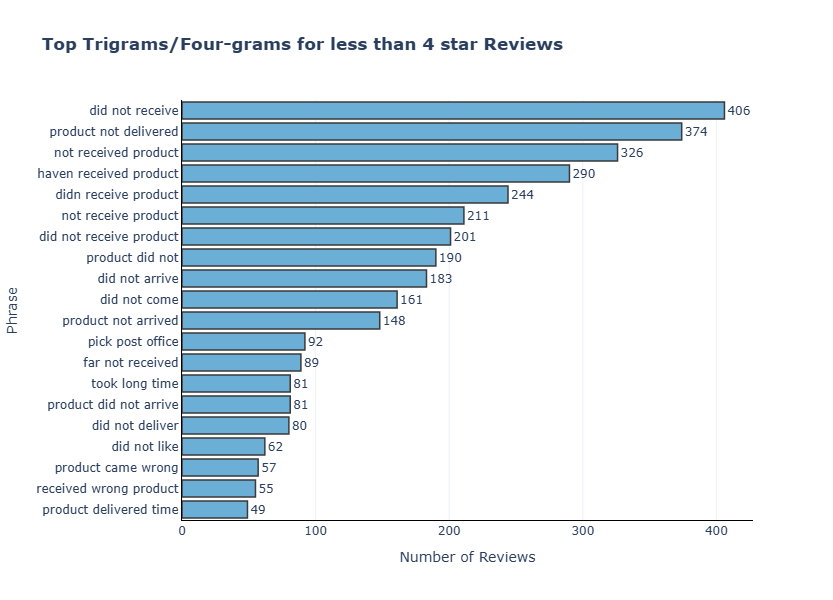

In [6]:
stop_words = set(ENGLISH_STOP_WORDS)
stop_words -= {"no","not","never","nor","neither"}
stop_words.update({"does","do","have","has","had"})

negative_reviews = df_text[df_text["review_score"] <= 3.99]["review_comment_message_english"]

vectorizer_neg = CountVectorizer(ngram_range=(3,4),stop_words=list(stop_words),max_features=30,min_df=10,binary=True)
neg_matrix = vectorizer_neg.fit_transform(negative_reviews)

neg_freq = pd.DataFrame({"phrase": vectorizer_neg.get_feature_names_out(),"count": neg_matrix.sum(axis=0).A1}).sort_values("count", ascending=False)
fig = px.bar(neg_freq.head(20), x="count", y="phrase", orientation="h",color_discrete_sequence=["#6BAED6"],title="<b>Top Trigrams/Four-grams for less than 4 star Reviews</b>",text_auto=True)
fig.update_layout(template="plotly_white", height=600, width=800, yaxis={"categoryorder":"total ascending"})
fig.update_traces(marker_line_color="#3A3A3A",marker_line_width=1.5,textposition="outside")
fig.update_yaxes(showline=True,linecolor="black",title_text="Phrase")
fig.update_xaxes(showline=True,linecolor="black",title_text="Number of Reviews")
fig.show(config={"toImageButtonOptions": {"format":"png","filename":"Negative_review_Ngrams","scale":4}})

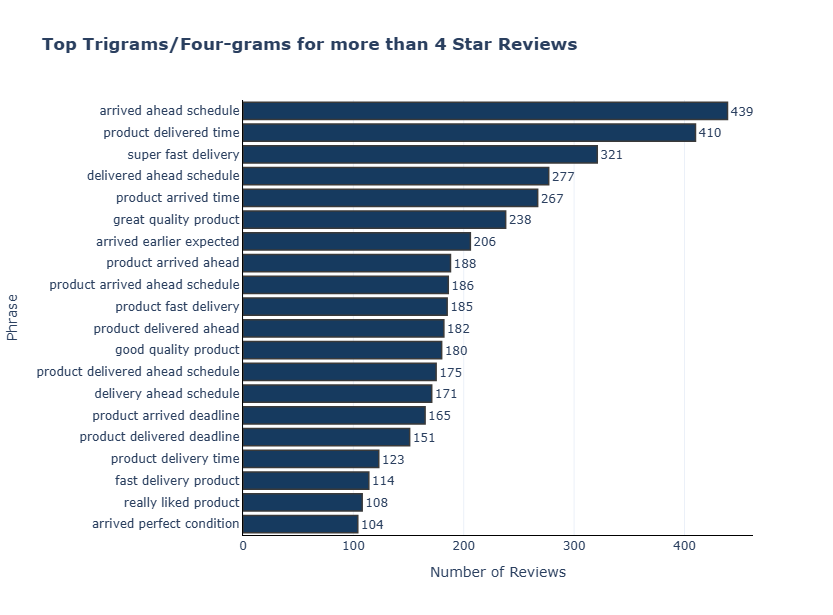

In [9]:
positive_reviews = df_text[df_text["review_score"] > 3.99]["review_comment_message_english"]
vectorizer_pos = CountVectorizer(ngram_range=(3,4), stop_words=list(stop_words), max_features=30, min_df=10,binary=True)
pos_matrix = vectorizer_pos.fit_transform(positive_reviews)
pos_freq = pd.DataFrame({"phrase": vectorizer_pos.get_feature_names_out(),"count": pos_matrix.sum(axis=0).A1}).sort_values("count", ascending=False)

fig = px.bar(pos_freq.head(20), x="count", y="phrase", orientation="h",color_discrete_sequence=["#163A5F"],title="<b>Top Trigrams/Four-grams for more than 4 Star Reviews</b>",text_auto=True)
fig.update_layout(template="plotly_white", height=600, width=850, yaxis={"categoryorder":"total ascending"})
fig.update_traces(marker_line_color="#3A3A3A",marker_line_width=1.5,textposition="outside")
fig.update_yaxes(showline=True,linecolor="black",title_text="Phrase")
fig.update_xaxes(showline=True,linecolor="black",title_text="Number of Reviews")
fig.show(config={"toImageButtonOptions": {"format":"png","filename":"Positive_review_Ngrams","scale":4}})

# Logistics Analysis

In [70]:
# Mean Delivery days for customer-seller state pair
query12 = text("""
    select * from order_items
    left join orders on order_items.order_id = orders.order_id
    left join customers on orders.customer_id = customers.customer_id
    left join sellers on order_items.seller_id = sellers.seller_id
    where orders.order_status = 'delivered'
    """)

df12 = pd.read_sql(query12,engine)
df12 = df12.loc[:, ~df12.columns.duplicated()]

In [71]:
import unicodedata
import re
def normalize(city):
    normalized = unicodedata.normalize("NFKD", city)
    clean_city = re.sub(r"[-']"," ",normalized.encode("ascii", "ignore").decode("utf-8").strip())
    return clean_city

print(normalize("águas lindas de goiás"))
print(normalize("mogi-guacu"))

aguas lindas de goias
mogi guacu


In [72]:
df12["customer_city"] = df12["customer_city"].apply(normalize)
df12["seller_city"] = df12["seller_city"].apply(normalize)

In [73]:
df12["delivery_days"] = (df12["order_delivered_customer_date"] - df12["order_purchase_timestamp"]).dt.total_seconds()/86400

In [74]:
temp_logi=df12.groupby("order_id")["delivery_days"].apply(list).reset_index()
temp_logi[temp_logi["delivery_days"].apply(lambda x: len(set(x)) > 1)]
# if empty then For delivered orders, all  delivery_days values within an order are same.

,order_id,delivery_days


In [75]:
# Overall Average Delivery Days
df12.drop_duplicates("order_id")["delivery_days"].describe()

count    96470.000000
mean        12.558217
std          9.546156
min          0.533414
25%          6.766204
50%         10.217477
75%         15.720182
max        209.628611
Name: delivery_days, dtype: float64

In [76]:
# df12 contain multiple row per order so it can cause 
#    - Same-seller multi-item orders get over-weighted
#    - An order contain multiple seller 
# so we will keep unique (order_id, seller_state)
df12_temp = df12.drop_duplicates(subset=["order_id","seller_state"])

In [77]:
temp123 = pd.pivot_table(df12_temp,index="customer_state",columns="seller_state",values="delivery_days",aggfunc=lambda x: pd.Series.sum(x,min_count=2)/pd.Series.count(x))

In [78]:
temp123

seller_state,BA,CE,DF,ES,GO,MA,MG,MS,MT,PA,...,PE,PI,PR,RJ,RN,RO,RS,SC,SE,SP
customer_state,,,,,,,,,,,,,,,,,,,,,
AC,NaN,NaN,NaN,NaN,NaN,NaN,22.451142,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,17.550359,15.974251,NaN,20.767769
AL,16.247163,19.442396,13.726140,NaN,21.041146,30.180179,22.001039,NaN,NaN,NaN,...,16.960210,NaN,29.249662,24.065086,NaN,NaN,19.947543,22.611610,NaN,25.027070
AM,NaN,NaN,NaN,NaN,32.170145,NaN,27.037327,NaN,NaN,NaN,...,NaN,NaN,24.760970,22.260266,NaN,NaN,21.669324,27.611059,NaN,25.847126
AP,20.990388,NaN,NaN,NaN,NaN,NaN,25.425559,NaN,NaN,NaN,...,NaN,NaN,21.405191,NaN,NaN,NaN,16.472068,30.359760,NaN,28.096443
BA,10.523251,19.601979,18.210128,13.086860,14.319222,21.872072,18.391648,31.016551,14.052708,NaN,...,11.740654,NaN,21.853249,16.937244,16.384218,NaN,20.967922,20.734371,NaN,19.793216
CE,15.358008,6.321636,23.788318,13.243453,18.513749,13.194199,20.697652,NaN,24.222610,NaN,...,10.905481,NaN,25.101497,24.916870,28.750922,NaN,17.061549,27.842815,NaN,21.243534
DF,11.360367,NaN,5.126908,NaN,9.345985,16.200297,11.851881,10.242477,11.216291,NaN,...,11.586665,NaN,13.396265,14.228011,NaN,NaN,13.512817,13.261973,NaN,13.242766
ES,13.790486,18.767010,18.563735,8.480296,15.021199,28.534771,16.162833,NaN,22.054925,NaN,...,13.547129,NaN,17.668207,12.563597,NaN,NaN,12.490254,14.750095,NaN,15.785018
GO,16.908628,NaN,9.194003,12.953762,5.169021,21.508032,14.130655,NaN,12.083468,NaN,...,13.997143,NaN,15.942555,15.077521,NaN,NaN,16.264991,17.716604,NaN,16.011824


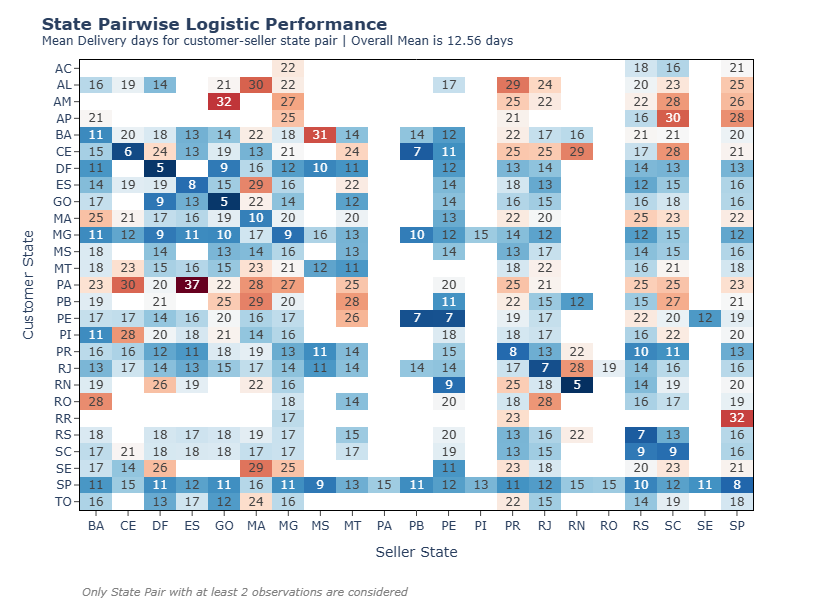

In [79]:
fig = px.imshow(temp123,aspect="auto",text_auto=".0f",color_continuous_scale="RdBu_r")
fig.update_xaxes(showgrid=False,showline=True,linewidth=1,linecolor="black",mirror=True,title_text="Seller State",ticks="outside")
fig.update_yaxes(showgrid=False,showline=True,linewidth=1,linecolor="black",mirror=True,title_text="Customer State",ticks="outside")
fig.update_layout(template="plotly_white",height=600,width=800,plot_bgcolor="white",title_text="<b>State Pairwise Logistic Performance</b><br><sup>Mean Delivery days for customer-seller state pair | Overall Mean is 12.56 days</sup>",coloraxis_showscale=False,margin={"b":90})
fig.add_annotation(text="<i>Only State Pair with at least 2 observations are considered</i>",xref="paper",yref="paper",x=0,y=-0.2,showarrow=False,font={"color":"gray","size":11})
fig.show(config={"toImageButtonOptions": {"format": "png","filename": "State_Pairwise_logistic_analysis","scale": 4}})

In [58]:
# Mean Delivery Days by State
temp_delivery1=df12_temp.groupby("customer_state")["delivery_days"].apply("mean").reset_index()
temp_delivery1["lat"] = temp_delivery1["customer_state"].map(lambda s: state_centroids[s][0])
temp_delivery1["lon"] = temp_delivery1["customer_state"].map(lambda s: state_centroids[s][1])
temp_delivery1

,customer_state,delivery_days,lat,lon
0,AC,21.035713,-9.0238,-70.812
1,AL,24.528421,-9.5713,-36.782
2,AM,26.425991,-3.4170,-65.858
3,AP,27.185068,1.4100,-51.770
4,BA,19.316620,-12.5780,-41.703
5,CE,21.248539,-5.4980,-39.320
6,DF,12.937896,-15.7800,-47.930
7,ES,15.761995,-19.1870,-40.308
8,GO,15.591825,-15.8270,-49.836
9,MA,21.493836,-4.9620,-45.274


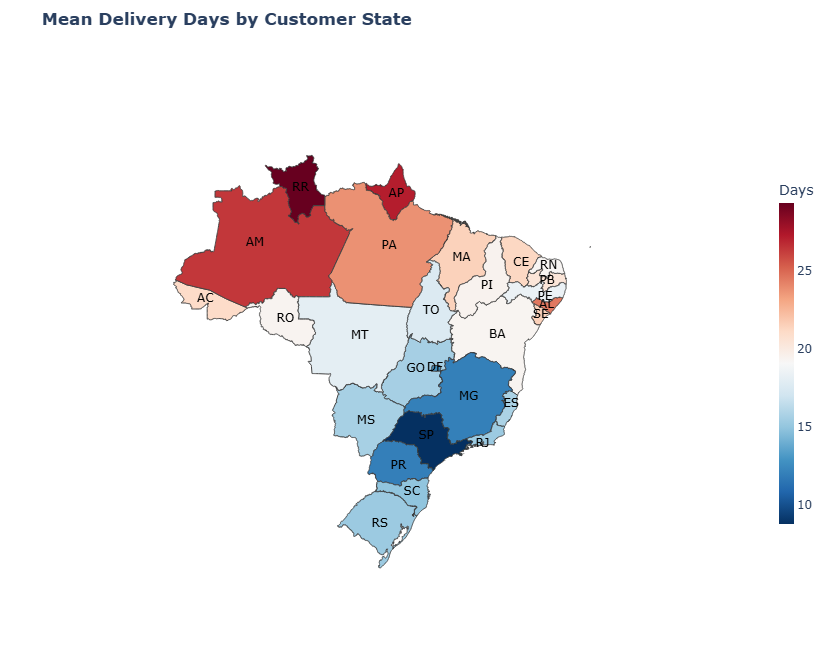

In [120]:
fig = px.choropleth(temp_delivery1, geojson=brazil_geojson, locations="customer_state", color="delivery_days",color_continuous_scale="RdBu_r", scope="south america",title="<b>Mean Delivery Days by Customer State</b>")

fig.add_scattergeo(lon=temp_delivery1["lon"], lat=temp_delivery1["lat"],
    text=temp_delivery1["customer_state"],
    mode="text",
    textfont=dict(size=12, color="black"),
    showlegend=False,
    hoverinfo="skip"
)

fig.update_geos(fitbounds="locations", visible=False, projection_scale=1.6)
fig.update_layout(template="plotly_white", height=650, width=900,margin={"t":50,"b":10,"l":10,"r":10},coloraxis_colorbar_len=0.6,coloraxis_colorbar_thickness=15,coloraxis_colorbar_title="Days")
fig.show(config={"toImageButtonOptions": {"format": "png", "filename": "Mean_delivery_days_by_customer_state", "scale": 4}})

In [60]:
df12_temp["within_state"] = df12_temp["customer_state"] == df12_temp["seller_state"]
same_state_df=df12_temp.groupby("within_state")["delivery_days"].agg(["mean","median","count"])
same_state_df

,mean,median,count
within_state,,,
False,15.114794,12.758773,62164
True,7.940910,6.539942,34822


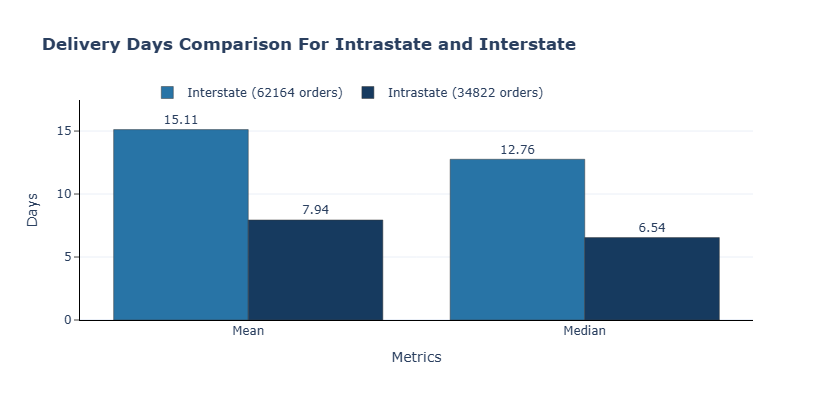

In [131]:
temp_same_state = same_state_df.stack().reset_index().rename(columns={'level_1':"Metrics",0:"Days"}).query("Metrics != 'count'")
temp_same_state["within_state"] = temp_same_state["within_state"].map({True: "Intrastate", False: "Interstate"})
fig = px.bar(temp_same_state,x="Metrics",y="Days",color="within_state",barmode="group",text_auto=".2f",labels={"within_state": ""},title="<b>Delivery Days Comparison For Intrastate and Interstate</b>")
fig.update_traces(marker_color="#163A5F",selector={"name":"Intrastate"})
fig.update_traces(marker_color="#2874A6",selector={"name":"Interstate"})
fig.update_traces(marker_line_color="#3A3A3A",marker_line_width=0.5,textposition='outside')
fig.update_layout(template="plotly_white",height=400,width=600,legend={"orientation":"h","yref":"paper","xref":"paper","x":0.1,"y":1.1})
fig.update_yaxes(showline=True,linecolor="black",ticks="outside")
fig.update_xaxes(showline=True,linecolor="black",tickvals=["mean","median"],ticktext=["Mean","Median"])
fig.data[0].name = "Interstate (62164 orders)"
fig.data[1].name = "Intrastate (34822 orders)"
fig.show(config={"toImageButtonOptions": {"format": "png","filename": "Intrastate_and_Interstate","scale": 4 }})

In [80]:
temp_freight1 = df12.groupby(["order_id","seller_state","customer_state"])["freight_value"].sum().reset_index()

In [81]:
temp_freight2 = temp_freight1.groupby("customer_state")["freight_value"].mean().reset_index()
temp_freight2["lat"] = temp_freight2["customer_state"].map(lambda s: state_centroids[s][0])
temp_freight2["lon"] = temp_freight2["customer_state"].map(lambda s: state_centroids[s][1])

In [82]:
temp_freight2

,customer_state,freight_value,lat,lon
0,AC,45.554500,-9.0238,-70.812
1,AL,38.484347,-9.5713,-36.782
2,AM,37.445724,-3.4170,-65.858
3,AP,41.298507,1.4100,-51.770
4,BA,29.860321,-12.5780,-41.703
5,CE,36.411381,-5.4980,-39.320
6,DF,23.721291,-15.7800,-47.930
7,ES,24.409602,-19.1870,-40.308
8,GO,26.158681,-15.8270,-49.836
9,MA,42.533384,-4.9620,-45.274


In [83]:
# Overall mean
df12.groupby("order_id")["freight_value"].sum().describe()

count    96478.000000
mean        22.785253
std         21.559197
min          0.000000
25%         13.850000
50%         17.170000
75%         24.017500
max       1794.960000
Name: freight_value, dtype: float64

In [84]:
# Interstate vs Intrastate
temp_freight1["within_state"] = temp_freight1["customer_state"] == temp_freight1["seller_state"]
freight_state_compare = temp_freight1.groupby("within_state")["freight_value"].agg(["mean","median","count"])
freight_state_compare

,mean,median,count
within_state,,,
False,26.736075,19.00,62167
True,15.395357,12.69,34827


In [129]:
sp_lat, sp_lon = state_centroids["SP"]

temp_freight2["distance_from_sp"] = temp_freight2["customer_state"].apply(
    lambda s: haversine(sp_lat, sp_lon, *state_centroids[s])
)

corr = temp_freight2["distance_from_sp"].corr(temp_freight2["freight_value"])
print(f"Correlation between distance from São Paulo and freight: {corr:.3f}")

Correlation between distance from São Paulo and freight: 0.882


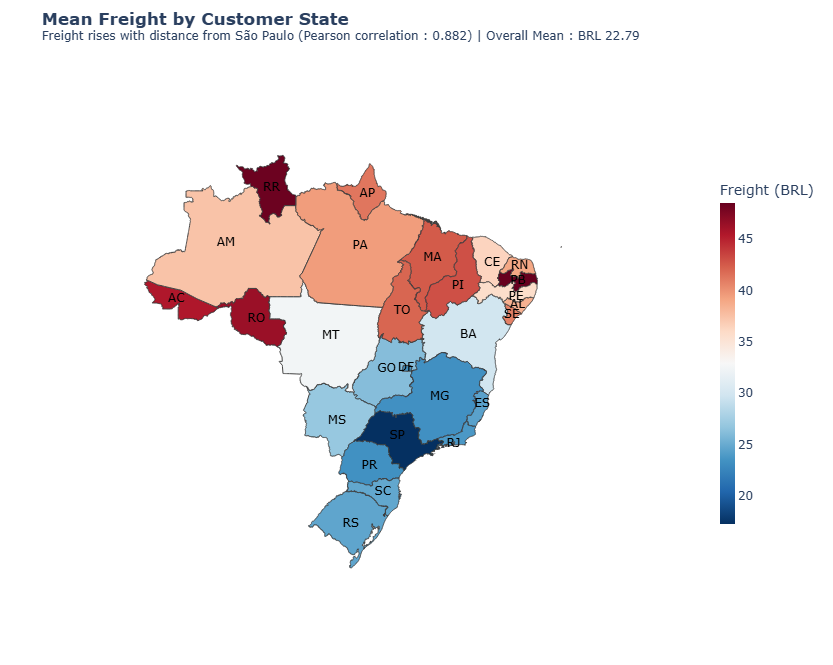

In [130]:
fig = px.choropleth(temp_freight2, geojson=brazil_geojson, locations="customer_state", color="freight_value",color_continuous_scale="RdBu_r", scope="south america",title="<b>Mean Freight by Customer State</b><br><sup>Freight rises with distance from São Paulo (Pearson correlation : 0.882) | Overall Mean : BRL 22.79</sup>")

fig.add_scattergeo(lon=temp_freight2["lon"], lat=temp_freight2["lat"],
    text=temp_freight2["customer_state"],
    mode="text",
    textfont=dict(size=12, color="black"),
    showlegend=False,
    hoverinfo="skip"
)

fig.update_geos(fitbounds="locations", visible=False, projection_scale=1.6)
fig.update_layout(template="plotly_white", height=650, width=900,margin={"t":50,"b":10,"l":10,"r":10},coloraxis_colorbar_len=0.6,coloraxis_colorbar_thickness=15,coloraxis_colorbar_title="Freight (BRL)")
fig.show(config={"toImageButtonOptions": {"format": "png", "filename": "Mean_freight_by_customer_state", "scale": 4}})

In [88]:
temp_f123 = pd.pivot_table(temp_freight1,index="customer_state",columns="seller_state",values="freight_value",aggfunc=lambda x: pd.Series.sum(x,min_count=2)/pd.Series.count(x))
temp_f123

seller_state,BA,CE,DF,ES,GO,MA,MG,MS,MT,PA,...,PE,PI,PR,RJ,RN,RO,RS,SC,SE,SP
customer_state,,,,,,,,,,,,,,,,,,,,,
AC,NaN,NaN,NaN,NaN,NaN,NaN,48.241000,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,37.455000,59.055000,NaN,45.284912
AL,21.797778,20.425000,54.282500,NaN,37.103333,23.755000,57.058286,NaN,NaN,NaN,...,14.558889,NaN,47.859722,29.306923,NaN,NaN,42.871000,38.940909,NaN,36.641797
AM,NaN,NaN,NaN,NaN,26.565000,NaN,41.488462,NaN,NaN,NaN,...,NaN,NaN,50.570000,38.531250,NaN,NaN,53.374000,56.927500,NaN,34.041313
AP,35.890000,NaN,NaN,NaN,NaN,NaN,44.006667,NaN,NaN,NaN,...,NaN,NaN,74.995000,NaN,NaN,NaN,37.763333,58.037500,NaN,39.991020
BA,19.047727,24.670000,27.343714,47.818261,31.453750,22.726000,29.609185,42.486667,44.642500,NaN,...,26.120000,NaN,50.764444,30.702593,31.410000,NaN,59.490000,46.921772,NaN,27.609693
CE,31.473571,42.852222,28.177143,68.563333,46.530000,16.837778,41.734054,NaN,38.620000,NaN,...,24.445882,NaN,47.108594,35.603889,24.980000,NaN,49.706667,68.481818,NaN,34.806330
DF,28.338750,NaN,10.993000,NaN,15.873214,24.480370,25.357143,24.427500,25.833333,NaN,...,25.551333,NaN,33.226755,19.662525,NaN,NaN,31.510208,33.755507,NaN,22.475519
ES,25.709091,23.310000,25.480526,27.038571,36.900000,28.496923,29.109314,NaN,38.505000,NaN,...,22.661765,NaN,34.032727,20.613500,NaN,NaN,35.710833,33.825000,NaN,22.700859
GO,36.613750,NaN,19.339333,51.876667,14.907097,31.738125,32.507086,NaN,27.069000,NaN,...,39.807500,NaN,38.486322,23.801101,NaN,NaN,37.758696,49.028929,NaN,23.831622


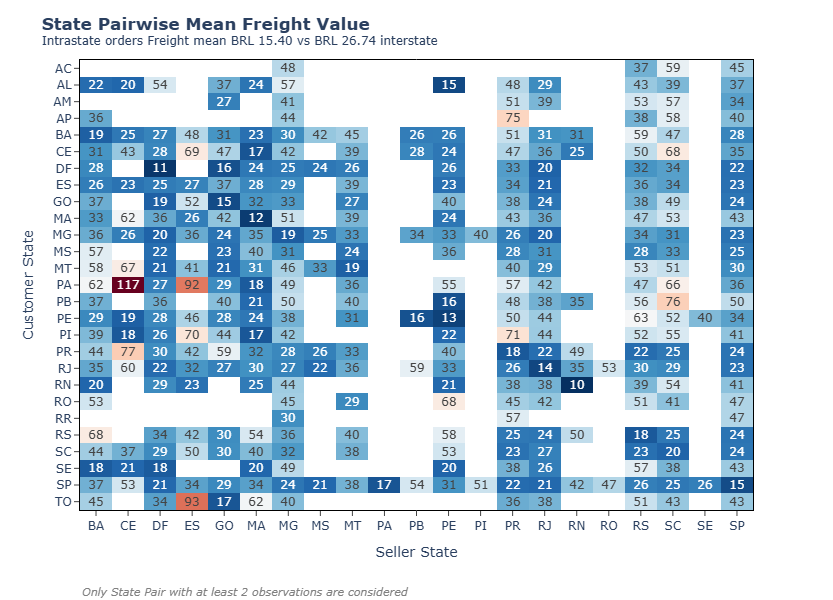

In [89]:
fig = px.imshow(temp_f123,aspect="auto",text_auto=".0f",color_continuous_scale="RdBu_r")
fig.update_xaxes(showgrid=False,showline=True,linewidth=1,linecolor="black",mirror=True,title_text="Seller State",ticks="outside")
fig.update_yaxes(showgrid=False,showline=True,linewidth=1,linecolor="black",mirror=True,title_text="Customer State",ticks="outside")
fig.update_layout(height=600,width=800,plot_bgcolor="white",title_text="<b>State Pairwise Mean Freight Value</b><br><sup>Intrastate orders Freight mean BRL 15.40 vs BRL 26.74 interstate</sup>",coloraxis_showscale=False,margin={"b":90})
fig.add_annotation(text="<i>Only State Pair with at least 2 observations are considered</i>",xref="paper",yref="paper",x=0,y=-0.2,showarrow=False,font={"color":"gray","size":11})
fig.show(config={"toImageButtonOptions": {
                    "format": "png",
                    "filename": "State_Pairwise_Freight_analysis",
                    "scale": 4}})

- The distance between a customer and seller is calculated using the Haversine formula
$$ d_{i,j} = 2R \cdot \arcsin \left( \sqrt{\sin^2\left(\frac{\phi_j-\phi_i}{2}\right) +\cos(\phi_i)\cos(\phi_j)\sin^2\left(\frac{\lambda_j-\lambda_i}{2}\right)} \right)$$
    - $d_{i,j}$ represents the great-circle distance between customer $i$ and seller $j$.
    - $R$ is the radius of the Earth (~ 6,371 km).
    - $\phi_i, \phi_j$ are the latitudes of the two locations in radians.
    - $\lambda_i, \lambda_j$ are the longitudes of the two locations in radians

In [90]:
def haversine(lat1, lon1, lat2, lon2):

    lat1 = np.radians(lat1)
    lon1 = np.radians(lon1)
    lat2 = np.radians(lat2)
    lon2 = np.radians(lon2)

    dlat = lat2 - lat1
    dlon = lon2 - lon1

    a = np.sin(dlat / 2) ** 2+ np.cos(lat1)* np.cos(lat2)* np.sin(dlon / 2) ** 2

    return 2 * 6371 * np.arcsin(np.sqrt(a))

In [91]:
# Removing Outliers

query13 = text(
    """
    select * from geolocation
    where (geolocation_lat Between -33.7509361 and 5.2695815) and (geolocation_lng Between -73.9830601 and -28.8476837)
    """
)
df13 = pd.read_sql(query13,engine)

In [92]:
df13["geolocation_city"] = df13["geolocation_city"].apply(normalize)

In [93]:
temp_13=df13.groupby("geolocation_zip_code_prefix")["geolocation_city"].apply(set)

In [94]:
temp_13[temp_13.str.len()>1]

geolocation_zip_code_prefix
1307                  {sao bernardo do campo, sao paulo}
3203                                {jundiai, sao paulo}
4004                        {sao paulo, taboao da serra}
4132                               {saopaulo, sao paulo}
4346                                     {sp, sao paulo}
                              ...                       
96222                               {quinta, rio grande}
96859                 {santa cruz do sul, monte alverne}
97538                  {barrado quarai, barra do quarai}
97573    {sant ana do livramento, santana do livramento}
97578    {sant ana do livramento, santana do livramento}
Name: geolocation_city, Length: 517, dtype: object

In [95]:
def get_mode(x):
    if x.empty:
        return None
    return x.mode().iloc[0]
geolocation_df = df13.groupby("geolocation_zip_code_prefix").agg(geolocation_lat=("geolocation_lat","mean"),geolocation_lng=("geolocation_lng","mean"),geolocation_city=("geolocation_city",get_mode),geolocation_state=("geolocation_state",get_mode))

In [96]:
geolocation_df = geolocation_df.reset_index()

In [97]:
query15 = text("""
        select * from order_items
        left join orders on order_items.order_id = orders.order_id
        left join products on order_items.product_id = products.product_id
        left join customers on orders.customer_id = customers.customer_id
        left join sellers on order_items.seller_id = sellers.seller_id
        """)

df15 = pd.read_sql(query15,engine)
df15 = df15.loc[:, ~df15.columns.duplicated()]

In [98]:
df15.columns

Index(['order_id', 'order_item_id', 'product_id', 'seller_id',
       'shipping_limit_date', 'price', 'freight_value', 'customer_id',
       'order_status', 'order_purchase_timestamp', 'order_approved_at',
       'order_delivered_carrier_date', 'order_delivered_customer_date',
       'order_estimated_delivery_date', 'product_category_name',
       'product_name_lenght', 'product_description_lenght',
       'product_photos_qty', 'product_weight_g', 'product_length_cm',
       'product_height_cm', 'product_width_cm', 'customer_unique_id',
       'customer_zip_code_prefix', 'customer_city', 'customer_state',
       'seller_zip_code_prefix', 'seller_city', 'seller_state'],
      dtype='str')

In [99]:
# Count distinct sellers per order
sellers_per_order = df15.groupby("order_id")["seller_id"].nunique()
single_seller_orders = sellers_per_order[sellers_per_order == 1].index

print(f"Total orders: {sellers_per_order.shape[0]}")
print(f"Single-seller orders: {len(single_seller_orders)} ({len(single_seller_orders)/sellers_per_order.shape[0]*100:.2f}%)")

Total orders: 98666
Single-seller orders: 97388 (98.70%)


In [100]:
df15_temp = df15[df15["order_id"].isin(single_seller_orders)]

In [101]:
df15_temp

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,customer_id,order_status,order_purchase_timestamp,...,product_length_cm,product_height_cm,product_width_cm,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,seller_zip_code_prefix,seller_city,seller_state
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29,3ce436f183e68e07877b285a838db11a,delivered,2017-09-13 08:59:02,...,28.0,9.0,14.0,871766c5855e863f6eccc05f988b23cb,28013,campos dos goytacazes,RJ,27277,volta redonda,SP
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93,f6dd3ec061db4e3987629fe6b26e5cce,delivered,2017-04-26 10:53:06,...,50.0,30.0,40.0,eb28e67c4c0b83846050ddfb8a35d051,15775,santa fe do sul,SP,3471,sao paulo,SP
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87,6489ae5e4333f3693df5ad4372dab6d3,delivered,2018-01-14 14:33:31,...,33.0,13.0,33.0,3818d81c6709e39d06b2738a8d3a2474,35661,para de minas,MG,37564,borda da mata,MG
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79,d4eb9395c8c0431ee92fce09860c5a06,delivered,2018-08-08 10:00:35,...,16.0,10.0,15.0,af861d436cfc08b2c2ddefd0ba074622,12952,atibaia,SP,14403,franca,SP
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14,58dbd0b2d70206bf40e62cd34e84d795,delivered,2017-02-04 13:57:51,...,35.0,40.0,30.0,64b576fb70d441e8f1b2d7d446e483c5,13226,varzea paulista,SP,87900,loanda,PR
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112645,fffc94f6ce00a00581880bf54a75a037,1,4aa6014eceb682077f9dc4bffebc05b0,b8bc237ba3788b23da09c0f1f3a3288c,2018-05-02 04:11:01,299.99,43.41,b51593916b4b8e0d6f66f2ae24f2673d,delivered,2018-04-23 13:57:06,...,89.0,15.0,40.0,0c9aeda10a71f369396d0c04dce13a64,65077,sao luis,MA,88303,itajai,SC
112646,fffcd46ef2263f404302a634eb57f7eb,1,32e07fd915822b0765e448c4dd74c828,f3c38ab652836d21de61fb8314b69182,2018-07-20 04:31:48,350.00,36.53,84c5d4fbaf120aae381fad077416eaa0,delivered,2018-07-14 10:26:46,...,45.0,26.0,38.0,0da9fe112eae0c74d3ba1fe16de0988b,81690,curitiba,PR,1206,sao paulo,SP
112647,fffce4705a9662cd70adb13d4a31832d,1,72a30483855e2eafc67aee5dc2560482,c3cfdc648177fdbbbb35635a37472c53,2017-10-30 17:14:25,99.90,16.95,29309aa813182aaddc9b259e31b870e6,delivered,2017-10-23 17:07:56,...,21.0,24.0,19.0,cd79b407828f02fdbba457111c38e4c4,4039,sao paulo,SP,80610,curitiba,PR
112648,fffe18544ffabc95dfada21779c9644f,1,9c422a519119dcad7575db5af1ba540e,2b3e4a2a3ea8e01938cabda2a3e5cc79,2017-08-21 00:04:32,55.99,8.72,b5e6afd5a41800fdf401e0272ca74655,delivered,2017-08-14 23:02:59,...,20.0,20.0,20.0,eb803377c9315b564bdedad672039306,13289,vinhedo,SP,4733,sao paulo,SP


In [102]:
temp_df15 = df15_temp.merge(geolocation_df,left_on="customer_zip_code_prefix",right_on="geolocation_zip_code_prefix").drop(columns=["geolocation_zip_code_prefix","geolocation_city","geolocation_state"])
temp_df15.rename(columns={"geolocation_lat":"customer_lat","geolocation_lng":"customer_lng"},inplace=True)
temp_df15_2 = temp_df15.merge(geolocation_df,left_on="seller_zip_code_prefix",right_on="geolocation_zip_code_prefix").drop(columns=["geolocation_zip_code_prefix","geolocation_city","geolocation_state"])
temp_df15_2.rename(columns={"geolocation_lat":"seller_lat","geolocation_lng":"seller_lng"},inplace=True)

In [103]:
df = temp_df15_2[temp_df15_2["order_status"] == "delivered"].copy()
df["delivery_days"] = (df["order_delivered_customer_date"] - df["order_purchase_timestamp"]).dt.total_seconds()/86400
df["distance"] = haversine(df["customer_lat"],df["customer_lng"],df["seller_lat"],df["seller_lng"])

In [104]:
df_summary = df.groupby("order_id").agg(revenue=("price","sum"),
                           freight=("freight_value","sum"),
                           weight=("product_weight_g","sum"),
                           distance=("distance","first"),
                           delivery_days=("delivery_days","first"),
                           customer_zip_code_prefix=("customer_zip_code_prefix","first"),
                           customer_city=("customer_city","first"),
                           customer_state=("customer_state","first"),
                           seller_zip_code_prefix=("seller_zip_code_prefix","first"),
                           seller_city=("seller_city","first"),
                           seller_state=("seller_state","first"),
                           customer_lng = ("customer_lng","first"),
                           customer_lat = ("customer_lat","first"),
                           seller_lng = ("seller_lng","first"),
                           seller_lat = ("seller_lat","first")
                          )

In [105]:
df_summary[["revenue","freight","weight","distance","delivery_days"]].corr()

,revenue,freight,weight,distance,delivery_days
revenue,1.000000,0.409327,0.348810,0.080238,0.057668
freight,0.409327,1.000000,0.642533,0.320452,0.174836
weight,0.348810,0.642533,1.000000,-0.009669,0.074625
distance,0.080238,0.320452,-0.009669,1.000000,0.393387
delivery_days,0.057668,0.174836,0.074625,0.393387,1.000000


In [106]:
city_pair_summary = df_summary.groupby(["customer_city","seller_city"]).agg(avg_distance=("distance","mean"),order_count=("distance","count"),avg_freight=("freight","mean")).reset_index()
city_pair = city_pair_summary[city_pair_summary["order_count"] >= 10]

In [107]:
city_pair["customer_city"] = city_pair["customer_city"].str.capitalize()
city_pair["seller_city"] = city_pair["seller_city"].str.capitalize()
city_pair["pair"] = city_pair["customer_city"].str.cat(city_pair["seller_city"], sep="-")

In [108]:
top_freight_pair = city_pair.sort_values("avg_freight", ascending=False).head(5)
top_distance_pair = city_pair.sort_values("avg_distance", ascending=False).head(5)

In [109]:
top_freight_pair

,customer_city,seller_city,avg_distance,order_count,avg_freight,pair
11023,Fortaleza,Itaquaquecetuba,2348.317965,10,70.629000,Fortaleza-Itaquaquecetuba
25695,Rio de janeiro,Cachoeirinha,1100.786476,13,67.584615,Rio de janeiro-Cachoeirinha
25874,Rio de janeiro,Porto ferreira,446.183156,11,62.400909,Rio de janeiro-Porto ferreira
4489,Brasilia,Itaquaquecetuba,870.784793,14,58.005714,Brasilia-Itaquaquecetuba
25790,Rio de janeiro,Itaquaquecetuba,318.753767,130,57.602692,Rio de janeiro-Itaquaquecetuba


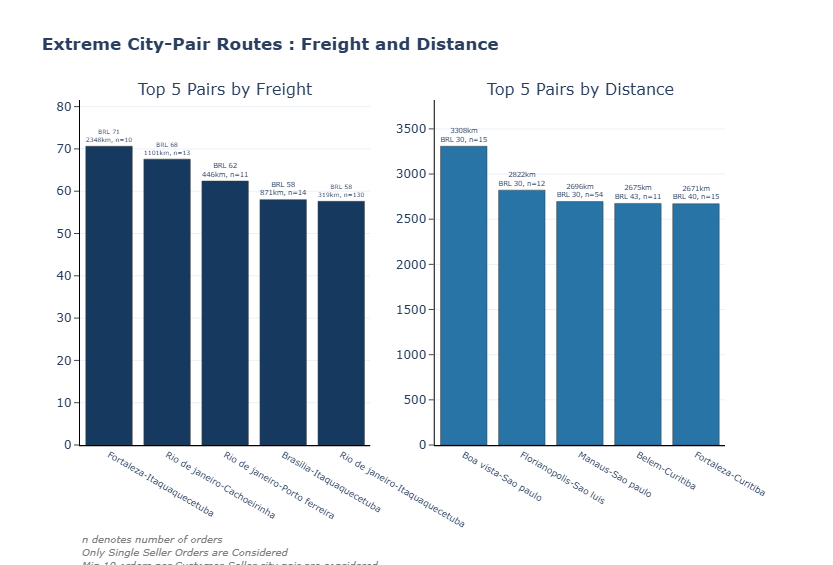

In [119]:
fig = make_subplots(rows=1, cols=2, subplot_titles=("Top 5 Pairs by Freight", "Top 5 Pairs by Distance"))

fig.add_trace(go.Bar(
    x=top_freight_pair["pair"], y=top_freight_pair["avg_freight"], name="Freight",
    marker_color="#163A5F",
    text=[f"BRL {f:.0f}<br>{d:.0f}km, n={n}" for f, d, n in
          zip(top_freight_pair["avg_freight"], top_freight_pair["avg_distance"], top_freight_pair["order_count"])],
    textposition="outside", textfont=dict(size=10)
), row=1, col=1)

fig.add_trace(go.Bar(
    x=top_distance_pair["pair"], y=top_distance_pair["avg_distance"], name="Distance",
    marker_color="#2874A6",
    text=[f"{d:.0f}km<br>BRL {f:.0f}, n={n}" for d, f, n in
          zip(top_distance_pair["avg_distance"], top_distance_pair["avg_freight"], top_distance_pair["order_count"])],
    textposition="outside", textfont=dict(size=10)
), row=1, col=2)

fig.update_yaxes(showline=True,linecolor="black",ticks="outside",zeroline=False)
fig.update_xaxes(showline=True,linecolor="black",linewidth=1.2,tickangle=30,tickfont={"size":9})
fig.update_traces(marker_line_color="#3A3A3A",marker_line_width=0.5)
fig.update_layout(height=550, width=1100, template="plotly_white",
    title_text="<b>Extreme City-Pair Routes : Freight and Distance</b>",
    showlegend=False, margin=dict(t=100, b=120))
fig.add_annotation(text="<i>n denotes number of orders<br>Only Single Seller Orders are Considered<br>Min 10 orders per Customer-Seller city pair are considered</i>",xref="paper", yref="paper", x=0, y=-0.37, showarrow=False,align="left", font={"color":"gray","size":10})
fig.show(config={"toImageButtonOptions": {"format":"png","filename":"Top_city_pairs","scale":4}})

In [121]:
df["delay_days"] = (df["order_delivered_customer_date"]- df["order_estimated_delivery_date"]).dt.total_seconds() / 86400

In [122]:
df["is_delayed"] = df["delay_days"] > 0

In [123]:
df

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,customer_id,order_status,order_purchase_timestamp,...,seller_city,seller_state,customer_lat,customer_lng,seller_lat,seller_lng,delivery_days,distance,delay_days,is_delayed
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29,3ce436f183e68e07877b285a838db11a,delivered,2017-09-13 08:59:02,...,volta redonda,SP,-21.762775,-41.309633,-22.496953,-44.127492,7.614421,301.504681,-8.011250,False
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93,f6dd3ec061db4e3987629fe6b26e5cce,delivered,2017-04-26 10:53:06,...,sao paulo,SP,-20.220527,-50.903424,-23.565096,-46.518565,16.216181,585.563937,-2.330278,False
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87,6489ae5e4333f3693df5ad4372dab6d3,delivered,2018-01-14 14:33:31,...,borda da mata,MG,-19.870305,-44.593326,-22.262584,-46.171124,7.948437,312.343511,-13.444954,False
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79,d4eb9395c8c0431ee92fce09860c5a06,delivered,2018-08-08 10:00:35,...,franca,SP,-23.089925,-46.611654,-20.553624,-47.387359,6.147269,293.168420,-5.435660,False
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14,58dbd0b2d70206bf40e62cd34e84d795,delivered,2017-02-04 13:57:51,...,loanda,PR,-23.243402,-46.827614,-22.929384,-53.135873,25.114352,646.163463,-15.303808,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
109003,fffc94f6ce00a00581880bf54a75a037,1,4aa6014eceb682077f9dc4bffebc05b0,b8bc237ba3788b23da09c0f1f3a3288c,2018-05-02 04:11:01,299.99,43.41,b51593916b4b8e0d6f66f2ae24f2673d,delivered,2018-04-23 13:57:06,...,itajai,SC,-2.497993,-44.297761,-26.912574,-48.673980,17.374699,2754.537709,-7.043981,False
109004,fffcd46ef2263f404302a634eb57f7eb,1,32e07fd915822b0765e448c4dd74c828,f3c38ab652836d21de61fb8314b69182,2018-07-20 04:31:48,350.00,36.53,84c5d4fbaf120aae381fad077416eaa0,delivered,2018-07-14 10:26:46,...,sao paulo,SP,-25.566904,-49.309115,-23.535864,-46.642819,9.420243,351.729420,-8.144502,False
109005,fffce4705a9662cd70adb13d4a31832d,1,72a30483855e2eafc67aee5dc2560482,c3cfdc648177fdbbbb35635a37472c53,2017-10-30 17:14:25,99.90,16.95,29309aa813182aaddc9b259e31b870e6,delivered,2017-10-23 17:07:56,...,curitiba,PR,-23.597794,-46.643923,-25.469955,-49.289821,4.801690,339.056961,-12.484468,False
109006,fffe18544ffabc95dfada21779c9644f,1,9c422a519119dcad7575db5af1ba540e,2b3e4a2a3ea8e01938cabda2a3e5cc79,2017-08-21 00:04:32,55.99,8.72,b5e6afd5a41800fdf401e0272ca74655,delivered,2017-08-14 23:02:59,...,sao paulo,SP,-23.040252,-46.979782,-23.635530,-46.694031,1.956030,72.335998,-8.083565,False


In [124]:
df_late_delivery = df.groupby("order_id").agg(revenue=("price","sum"),
                           delivery_days=("delivery_days","first"),
                           customer_zip_code_prefix=("customer_zip_code_prefix","first"),
                           customer_city=("customer_city","first"),
                           customer_state=("customer_state","first"),
                           seller_zip_code_prefix=("seller_zip_code_prefix","first"),
                           seller_city=("seller_city","first"),
                           seller_state=("seller_state","first"),
                           is_delayed = ("is_delayed","first")
                          ).reset_index()

In [125]:
df_late=df_late_delivery.groupby("customer_state").agg(is_delayed=("is_delayed",sum),orders=("order_id","count"))

In [126]:
df_late["pecentage_late_delivery"]=df_late["is_delayed"]/df_late["orders"]*100

In [127]:
df_late = df_late.reset_index()
df_late["lat"] = df_late["customer_state"].map(lambda s: state_centroids[s][0])
df_late["lon"] = df_late["customer_state"].map(lambda s: state_centroids[s][1])
df_late

,customer_state,is_delayed,orders,pecentage_late_delivery,lat,lon
0,AC,3,79,3.797468,-9.0238,-70.812
1,AL,95,394,24.111675,-9.5713,-36.782
2,AM,6,145,4.137931,-3.4170,-65.858
3,AP,3,67,4.477612,1.4100,-51.770
4,BA,451,3202,14.084947,-12.5780,-41.703
5,CE,196,1262,15.530903,-5.4980,-39.320
6,DF,137,1894,7.233369,-15.7800,-47.930
7,ES,239,1957,12.212570,-19.1870,-40.308
8,GO,160,1914,8.359457,-15.8270,-49.836
9,MA,138,702,19.658120,-4.9620,-45.274


In [ ]:
fig = px.choropleth(df_late, geojson=brazil_geojson, locations="customer_state", color="pecentage_late_delivery",color_continuous_scale="RdBu_r", scope="south america",title="<b>Late Delivered Orders % by Customer State</b><br>",labels={"pecentage_late_delivery":"% Late Delivery"},color_continuous_midpoint=10)

fig.add_scattergeo(lon=df_late["lon"], lat=df_late["lat"],
    text=df_late["customer_state"],
    mode="text",
    textfont=dict(size=12, color="black"),
    showlegend=False,
    hoverinfo="skip"
)

fig.update_geos(fitbounds="locations", visible=False, projection_scale=1.6)
fig.update_layout(template="plotly_white", height=650, width=900,margin={"t":50,"b":10,"l":10,"r":10},coloraxis_colorbar_len=0.6,coloraxis_colorbar_thickness=15)
fig.add_annotation(text="<i>Only Single Seller Orders are Considered</i>", x=0, y=0.01, showarrow=False,align="left", font={"color":"gray","size":11})
fig.show(config={"toImageButtonOptions": {"format": "png", "filename": "Late_deliveries_by_state", "scale": 4}})

# Root Cause Analysis of Late delivery in Feb-Mar 2018

In [2]:
query = text("""
        select * from order_items
        left join orders on order_items.order_id = orders.order_id
        left join products on order_items.product_id = products.product_id
        left join customers on orders.customer_id = customers.customer_id
        left join sellers on order_items.seller_id = sellers.seller_id
        left join product_category_name_translation t on products.product_category_name = t.product_category_name
        """)

df = pd.read_sql(query,engine)
df= df.loc[:, ~df.columns.duplicated()]

In [3]:
df["month_of_purchase"] = df['order_purchase_timestamp'].dt.strftime('%b-%Y')

In [4]:
df["purchase_to_approval"] = (df["order_approved_at"]-df["order_purchase_timestamp"]).dt.total_seconds()/86400
df["approval_to_carrier"] = (df["order_delivered_carrier_date"] - df["order_approved_at"]).dt.total_seconds()/86400
df["carrier_to_delivery"] = (df["order_delivered_customer_date"]- df["order_delivered_carrier_date"]).dt.total_seconds()/86400

In [5]:
df["is_late"] = df["order_estimated_delivery_date"] < df["order_delivered_customer_date"]

In [ ]:
df1=pd.pivot_table(df,index="month_of_purchase",columns="order_status",values="order_id",aggfunc="nunique").reset_index().sort_values(by="month_of_purchase",key= lambda x:pd.to_datetime(x))

In [7]:
status_columns = ["delivered", "shipped", "invoiced", "canceled", "processing", "unavailable", "approved"]
df1[status_columns] = df1[status_columns].fillna(0)
df1["total_order"]= df1['approved'] + df1['canceled']+df1['delivered']+df1['invoiced']+df1['processing']+df1['shipped']+df1['unavailable']

In [8]:
df1

order_status,month_of_purchase,approved,canceled,delivered,invoiced,processing,shipped,unavailable,total_order
21,Sep-2016,0.0,1.0,1.0,0.0,0.0,1.0,0.0,3.0
19,Oct-2016,0.0,12.0,265.0,16.0,2.0,7.0,6.0,308.0
4,Dec-2016,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
8,Jan-2017,0.0,2.0,750.0,12.0,9.0,16.0,0.0,789.0
6,Feb-2017,1.0,15.0,1653.0,11.0,32.0,21.0,0.0,1733.0
14,Mar-2017,0.0,24.0,2546.0,3.0,23.0,45.0,0.0,2641.0
0,Apr-2017,1.0,14.0,2303.0,14.0,10.0,49.0,0.0,2391.0
16,May-2017,0.0,20.0,3546.0,16.0,23.0,55.0,0.0,3660.0
12,Jun-2017,0.0,12.0,3135.0,11.0,12.0,47.0,0.0,3217.0
10,Jul-2017,0.0,23.0,3872.0,7.0,11.0,56.0,0.0,3969.0


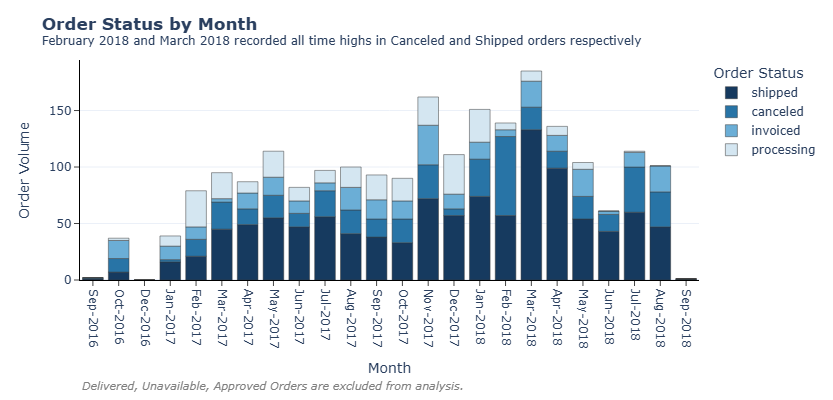

In [9]:
color = ["#163A5F", "#2874A6", "#6BAED6","#D4E6F1"]
fig = px.bar(df1,x="month_of_purchase",y=["shipped","canceled","invoiced","processing"],color_discrete_sequence=color)
fig.update_layout(yaxis_title="Order Volume",xaxis_title="Month",title_text="<b>Order Status by Month</b><br><sup>February 2018 and March 2018 recorded all time highs in Canceled and Shipped orders respectively</sup> ",template="plotly_white",legend_title_text="Order Status",margin={"b":120},height=400,width=800)
fig.update_traces(marker_line_color="#3A3A3A",marker_line_width=0.5)
fig.update_yaxes(showline=True,linecolor="black",linewidth=1,ticks="outside")
fig.update_xaxes(showline=True,linecolor="black",linewidth=1,ticks="outside",tickangle=90)
fig.add_annotation(text="<i>Delivered, Unavailable, Approved Orders are excluded from analysis.</i>", x=0, y=-0.52,yref="paper",xref="paper",showarrow=False,align="left", font={"color":"gray","size":11})
fig.show(config = {'toImageButtonOptions': {'format': 'png','filename': 'Order_Status_Analysis','height': 400,'width': 800,'scale': 4}})

In [10]:
df2 = df[df["order_status"] == 'delivered'].copy()

In [11]:
df2

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,customer_id,order_status,order_purchase_timestamp,...,customer_state,seller_zip_code_prefix,seller_city,seller_state,product_category_name_english,month_of_purchase,purchase_to_approval,approval_to_carrier,carrier_to_delivery,is_late
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29,3ce436f183e68e07877b285a838db11a,delivered,2017-09-13 08:59:02,...,RJ,27277,volta redonda,SP,cool_stuff,Sep-2017,0.032326,6.367141,1.214954,False
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93,f6dd3ec061db4e3987629fe6b26e5cce,delivered,2017-04-26 10:53:06,...,SP,3471,sao paulo,SP,pet_shop,Apr-2017,0.008414,8.145683,8.062083,False
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87,6489ae5e4333f3693df5ad4372dab6d3,delivered,2018-01-14 14:33:31,...,MG,37564,borda da mata,MG,furniture_decor,Jan-2018,0.010405,1.908542,6.029491,False
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79,d4eb9395c8c0431ee92fce09860c5a06,delivered,2018-08-08 10:00:35,...,SP,14403,franca,SP,perfumery,Aug-2018,0.006748,2.137292,4.003229,False
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14,58dbd0b2d70206bf40e62cd34e84d795,delivered,2017-02-04 13:57:51,...,SP,87900,loanda,PR,garden_tools,Feb-2017,0.008588,11.816620,13.289144,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112645,fffc94f6ce00a00581880bf54a75a037,1,4aa6014eceb682077f9dc4bffebc05b0,b8bc237ba3788b23da09c0f1f3a3288c,2018-05-02 04:11:01,299.99,43.41,b51593916b4b8e0d6f66f2ae24f2673d,delivered,2018-04-23 13:57:06,...,MA,88303,itajai,SC,housewares,Apr-2018,1.592998,0.331933,15.449769,False
112646,fffcd46ef2263f404302a634eb57f7eb,1,32e07fd915822b0765e448c4dd74c828,f3c38ab652836d21de61fb8314b69182,2018-07-20 04:31:48,350.00,36.53,84c5d4fbaf120aae381fad077416eaa0,delivered,2018-07-14 10:26:46,...,PR,1206,sao paulo,SP,computers_accessories,Jul-2018,2.753495,0.148056,6.518692,False
112647,fffce4705a9662cd70adb13d4a31832d,1,72a30483855e2eafc67aee5dc2560482,c3cfdc648177fdbbbb35635a37472c53,2017-10-30 17:14:25,99.90,16.95,29309aa813182aaddc9b259e31b870e6,delivered,2017-10-23 17:07:56,...,SP,80610,curitiba,PR,sports_leisure,Oct-2017,1.004502,1.915845,1.881343,False
112648,fffe18544ffabc95dfada21779c9644f,1,9c422a519119dcad7575db5af1ba540e,2b3e4a2a3ea8e01938cabda2a3e5cc79,2017-08-21 00:04:32,55.99,8.72,b5e6afd5a41800fdf401e0272ca74655,delivered,2017-08-14 23:02:59,...,SP,4733,sao paulo,SP,computers_accessories,Aug-2017,0.042743,0.790521,1.122766,False


In [12]:
temp = df2.groupby("order_id").agg(is_late=("is_late","first"),month_of_purchase=("month_of_purchase","first")).reset_index()

In [ ]:
temp1 = temp.groupby("month_of_purchase").agg(is_late=("is_late","mean"),order_volume=("order_id","nunique")).reset_index().sort_values(by="month_of_purchase",key= lambda x:pd.to_datetime(x))
temp1["is_late"] *=100

In [14]:
temp['date_parsed'] = pd.to_datetime(temp['month_of_purchase'], format='%b-%Y')
filtered_temp = temp[(temp['date_parsed'] >= '2016-10-01') & (temp['date_parsed'] <= '2018-01-31')]

In [15]:
filtered_temp["is_late"].mean()*100

np.float64(6.589445068258377)

In [16]:
temp[(temp['date_parsed'] >= '2018-02-01') & (temp['date_parsed'] <= '2018-02-28')]["is_late"].mean()/filtered_temp["is_late"].mean()

np.float64(2.4262734434057456)

In [17]:
temp[(temp['date_parsed'] >= '2018-03-01') & (temp['date_parsed'] <= '2018-03-31')]["is_late"].mean()/filtered_temp["is_late"].mean()

np.float64(3.241892616168983)

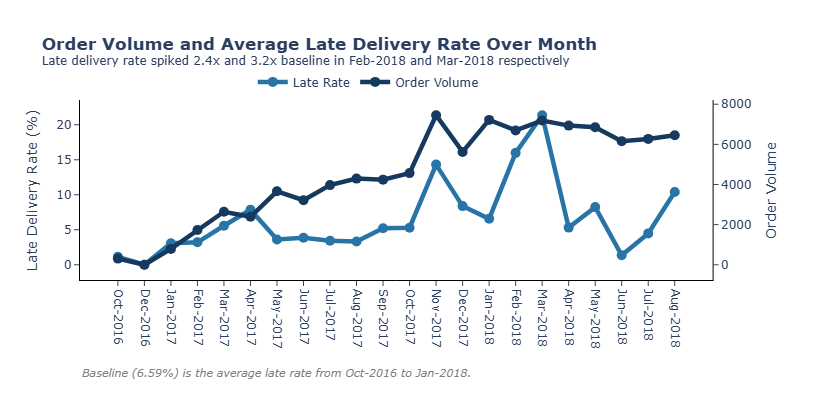

In [18]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

df_filtered = temp1.iloc[1:, :]
fig = make_subplots(specs=[[{"secondary_y": True}]])

fig.add_trace(go.Scatter(x=df_filtered["month_of_purchase"],y=df_filtered["is_late"],name="Late Rate",mode="lines+markers",line=dict(color="#2874A6", width=4.5), marker=dict(size=10)),secondary_y=False)
fig.add_trace(go.Scatter(x=df1.iloc[1:23,:]["month_of_purchase"],y=df1.iloc[1:23,:]["total_order"],name="Order Volume",mode="lines+markers",line=dict(color="#163A5F", width=4.5),marker=dict(size=10)),secondary_y=True)
fig.update_layout(template="plotly_white",title_text="<b>Order Volume and Average Late Delivery Rate Over Month</b><br><sup>Late delivery rate spiked 2.4x and 3.2x baseline in Feb-2018 and Mar-2018 respectively</sup>",height=400,width=800,
legend=dict(orientation="h",yanchor="bottom", y=1.02, xanchor="right", x=0.6),margin={"b":120})
fig.update_xaxes(showgrid=False,showline=True,ticks="outside",linecolor="black",tickangle=90,title_text="")
fig.update_yaxes(title_text="Late Delivery Rate (%)",showgrid=False,showline=True,zeroline=False,ticks="outside",linecolor="black",secondary_y=False)
fig.update_yaxes(title_text="Order Volume",showgrid=False,showline=True,zeroline=False,ticks="outside",linecolor="black",secondary_y=True)
fig.add_annotation(text="<i>Baseline (6.59%) is the average late rate from Oct-2016 to Jan-2018.</i>", x=0, y=-0.56,yref="paper",xref="paper",showarrow=False,align="left", font={"color":"gray","size":11})
fig.show(config={'toImageButtonOptions': {'format': 'png','filename': 'Late_delivery_rate_by_month','height': 400,'width': 700,'scale': 4}})

In [19]:
temp3 = df2.groupby("order_id").agg(
                    month_of_purchase = ("month_of_purchase","first"),
                    p_to_a = ("purchase_to_approval","first"),
                    a_to_c = ("approval_to_carrier","first"),
                    c_to_d = ("carrier_to_delivery","first")
        ).reset_index()
temp3["date_parsed"] = pd.to_datetime(temp3["month_of_purchase"],format="%b-%Y")

In [20]:
baseline = temp3[temp3["date_parsed"].between("2016-10-01", "2018-01-31")].mean(numeric_only=True)

In [21]:
feb = temp3[temp3["date_parsed"].between("2018-02-01", "2018-02-28")].mean(numeric_only=True)

In [22]:
march = temp3[temp3["date_parsed"].between("2018-03-01", "2018-03-31")].mean(numeric_only=True)

In [23]:
days = pd.concat([baseline,feb,march],axis=1)
days.rename(columns={0:"Baseline",1:"February 2018",2:"March 2018"},inplace=True)
days.index = ["Purchase to Approval","Approval to Carrier","Carrier to Delivered"]
days

,Baseline,February 2018,March 2018
Purchase to Approval,0.423487,0.402771,0.356462
Approval to Carrier,3.089282,3.159045,2.977117
Carrier to Delivered,9.692684,13.383322,12.967831


In [24]:
days["Baseline_feb2018"] = (days["February 2018"] - days["Baseline"])/days["Baseline"] *100
days["Baseline_mar2018"] = (days["March 2018"] - days["Baseline"])/days["Baseline"] *100
days

,Baseline,February 2018,March 2018,Baseline_feb2018,Baseline_mar2018
Purchase to Approval,0.423487,0.402771,0.356462,-4.891713,-15.826916
Approval to Carrier,3.089282,3.159045,2.977117,2.258206,-3.630781
Carrier to Delivered,9.692684,13.383322,12.967831,38.076525,33.789881


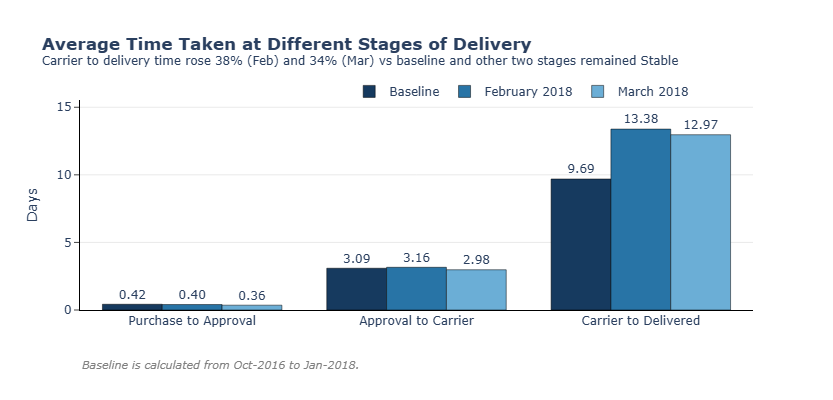

In [25]:
fig = px.bar(days,y=["Baseline","February 2018","March 2018"],barmode="group",text_auto=".2f",color_discrete_sequence=["#163A5F","#2874A6","#6BAED6"])
fig.update_yaxes(title_text="Days",showline=True,linecolor="black",ticks="outside",gridwidth=0.5,gridcolor="lightgrey",zeroline=False)
fig.update_xaxes(title_text="",showline=True,linecolor="black")
fig.update_layout(template="plotly_white",title_text="<b>Average Time Taken at Different Stages of Delivery</b><br><sup>Carrier to delivery time rose 38% (Feb) and 34% (Mar) vs baseline and other two stages remained Stable</sup>",legend={"title":"","orientation":"h","x":0.4,"y":1.11},margin={"t":100,"b":90},height=400,width=800)
fig.update_traces(textposition="outside",marker_line_width=0.5,marker_line_color="black")
fig.add_annotation(text="<i>Baseline is calculated from Oct-2016 to Jan-2018.</i>", x=0, y=-0.3,yref="paper",xref="paper",showarrow=False,align="left", font={"color":"gray","size":11})
fig.show(config={'toImageButtonOptions': {'format': 'png','filename': 'Time_taken_at_delivery_stages','height': 400,'width': 800,'scale': 4}})

In [22]:
df2["date_parsed"] = pd.to_datetime(df2["month_of_purchase"],format="%b-%Y")

In [29]:
conditions = [df2["date_parsed"].between("2016-10-01", "2018-01-31"),df2["date_parsed"].between("2018-02-01", "2018-02-28"),df2["date_parsed"].between("2018-03-01", "2018-03-31")]
choices = ["Baseline", "Feb 2018", "Mar 2018"]
df2["period"] = np.select(conditions, choices, default="post Mar 2018")

In [56]:
pd.pivot_table(df2,index="product_category_name_english",columns=["period","is_late"],values="order_id",aggfunc="nunique")

period                        Baseline        Feb 2018       Mar 2018         \
is_late                          False  True     False True     False  True    
product_category_name_english                                                  
Unknown                          873.0   85.0     97.0  10.0    100.0   25.0   
agro_industry_and_commerce        61.0    2.0     17.0   3.0     23.0    1.0   
air_conditioning                 130.0    6.0     10.0   1.0     20.0    3.0   
art                               50.0    1.0     11.0   NaN      6.0    1.0   
arts_and_craftmanship              2.0    NaN      NaN   NaN      NaN    NaN   
...                                ...    ...      ...   ...      ...    ...   
stationery                      1186.0   79.0    110.0  21.0    115.0   30.0   
tablets_printing_image            59.0    3.0     11.0   1.0      1.0    1.0   
telephony                       2159.0  160.0    278.0  50.0    248.0   72.0   
toys                            2407.0  173.0    109.0  21.0    175.0   40.0   
watches_gifts                   2244.0  155.0    241.0  63.0    296.0  111.0   

period                        post Mar 2018         
is_late                               False  True   
product_category_name_english                       
Unknown                               195.0    7.0  
agro_industry_and_commerce             67.0    3.0  
air_conditioning                       76.0    NaN  
art                                   113.0   13.0  
arts_and_craftmanship                  19.0    2.0  
...                                     ...    ...  
stationery                            677.0   46.0  
tablets_printing_image                  3.0    NaN  
telephony                            1059.0   67.0  
toys                                  827.0   52.0  
watches_gifts                        2246.0  139.0  

[74 rows x 8 columns]

In [20]:
df3 = df[df["order_status"] != 'delivered']

In [ ]:
df3.groupby("month_of_purchase")[["purchase_to_approval","approval_to_carrier","carrier_to_delivery"]].isna().sum()

# Initial Analysis

In [ ]:
# Revenue of each month
query = text("""
select DATE_FORMAT(o.order_purchase_timestamp,'%Y-%m') as month,
        round(sum(oi.price),2) as revenue
from order_items oi
left join orders o on oi.order_id = o.order_id
where o.order_status = 'delivered'
group by DATE_FORMAT(o.order_purchase_timestamp,'%Y-%m')
order by month
""")
df1 = pd.read_sql(query, engine)

In [ ]:
# Top 5 product of each category according to revenue generated
query2 = text(
    """
    with new as (select  t1.product_id,
            t1.product_category_name,
            p2.product_category_name_english,
            t1.total_revenue ,
            row_number() over( partition by product_category_name_english
                                order by total_revenue desc ) as product_rank from (
                                    select 
                                        oi.product_id, 
                                        p.product_category_name ,
                                        sum(oi.price) as total_revenue 
                                    from order_items oi
                                    left join products p on oi.product_id = p.product_id
                                    group by product_id
                                    order by sum(price) desc
                                 ) t1
    left join product_category_name_translation p2 
    on t1.product_category_name = p2.product_category_name)
    SELECT 
        product_id, 
        product_category_name, 
        product_category_name_english, 
        total_revenue,
        product_rank
    FROM new
    WHERE product_rank < 6
    """
)
df2 = pd.read_sql(query2,engine)

In [ ]:
df2_temp=df2[df2["product_category_name_english"].isin(["health_beauty","watches_gifts"])]
df2_temp

,product_id,product_category_name,product_category_name_english,total_revenue,product_rank
216,bb50f2e236e5eea0100680137654686c,beleza_saude,health_beauty,63885.00,1
217,6cdd53843498f92890544667809f1595,beleza_saude,health_beauty,54730.20,2
218,2b4609f8948be18874494203496bc318,beleza_saude,health_beauty,22717.22,3
219,19c91ef95d509ea33eda93495c4d3481,beleza_saude,health_beauty,18889.44,4
220,8c292ca193d326152e335d77176746f0,beleza_saude,health_beauty,14139.00,5
356,53b36df67ebb7c41585e8d54d6772e08,relogios_presentes,watches_gifts,37683.42,1
357,e0d64dcfaa3b6db5c54ca298ae101d05,relogios_presentes,watches_gifts,31786.82,2
358,d285360f29ac7fd97640bf0baef03de0,relogios_presentes,watches_gifts,31623.81,3
359,7a10781637204d8d10485c71a6108a2e,relogios_presentes,watches_gifts,30467.50,4
360,f819f0c84a64f02d3a5606ca95edd272,relogios_presentes,watches_gifts,29024.48,5


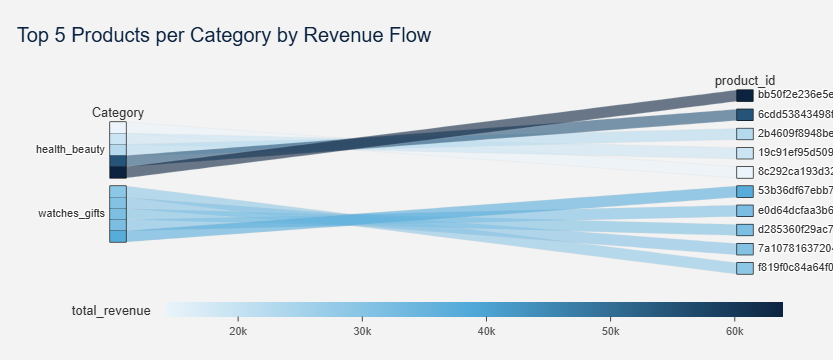

In [ ]:
fig = px.parallel_categories(
    df2[df2["product_category_name_english"].isin(["health_beauty","watches_gifts"])],
    dimensions=['product_category_name_english', 'product_id'],
    color='total_revenue',
    labels={
        'product_category_name_english': 'Category',
        'short_product_id': 'Product ID'
    },
    title="Top 5 Products per Category by Revenue Flow"
)

fig.update_layout(
    paper_bgcolor ="#f3f3f3",
    coloraxis_colorbar={
        "orientation":"h",
        "y":-0.1,
        "x":0.5,
        "yanchor":"top",
        "xanchor":"center"
    }
)

fig.show()

In [ ]:
query3 = text(
    """
    select * from geolocation
    """
)
df3 = pd.read_sql(query3,engine)

In [ ]:
query4 = text(
    """
    select * from customers
    """
)
df4 = pd.read_sql(query4,engine)

In [ ]:
df4.groupby('customer_id').filter(lambda x: x['customer_zip_code_prefix'].nunique() > 1)
# if empty df then each customer belong to one location only

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state


In [ ]:
del df5

In [ ]:
geo_df = df3.groupby("geolocation_zip_code_prefix").agg(
                                                        {"geolocation_lat":"mean",
                                                         "geolocation_lng":"mean",
                                                         "geolocation_city": "first",
                                                         "geolocation_state": "first"}
                                                        )

In [ ]:
geo_df

,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
geolocation_zip_code_prefix,,,,
1001,-23.550190,-46.634024,sao paulo,SP
1002,-23.548146,-46.634979,sao paulo,SP
1003,-23.548994,-46.635731,sao paulo,SP
1004,-23.549799,-46.634757,sao paulo,SP
1005,-23.549456,-46.636733,sao paulo,SP
...,...,...,...,...
99960,-27.953722,-52.025511,charrua,RS
99965,-28.183372,-52.039850,agua santa,RS
99970,-28.343766,-51.874689,ciriaco,RS


In [ ]:
import plotly.express as px

fig = px.scatter_geo(geo_df,
                    hover_name="geolocation_city",
                    lat="geolocation_lat", 
                    lon="geolocation_lng", 
                    projection="natural earth", 
                    title="<b>Olist Geolocation Data</b><br><sup>Average location for each ZIP code. It contains outliers.</sup>" 
)

fig.update_traces(marker=dict(size=4, color="#2874A6", opacity=0.7,line=dict(width=0.2, color="black"))) 
fig.update_layout(margin=dict(l=0, r=0, t=60, b=0))
fig.update_geos(landcolor="#F3F6F9")
fig.show(config={'toImageButtonOptions': {'format': 'png', 'filename': 'Brazil_coordinates','height': 800,'width': 1200,'scale': 4}})

In [ ]:
# Removing outliers
# Northernmost point: Monte Caburaí, Roraima[1] (5°16′10.4934″N 60°12′34.63848″W)
# Southernmost point: Arroio Chuí, Rio Grande do Sul[1] (33°45′3.36996″S 53°23′40.26336″W)
# Easternmost point: Ilha do Sul, Ilhas de Martim Vaz, Espírito Santo (20°29′49.99272″S 28°50′51.66132″W)
# Westernmost point: Serra do Divisor, Acre (7°32′5.03808″S 73°58′59.01636″W)
filtered_geo_df = df3[(df3["geolocation_lat"].between(-33.7509361,5.2695815)) & (df3["geolocation_lng"].between(-73.9830601,-28.8476837))]

In [ ]:
geo_df_2 = filtered_geo_df.groupby("geolocation_zip_code_prefix").agg(
                                                        {"geolocation_lat":"mean",
                                                         "geolocation_lng":"mean",
                                                         "geolocation_city": "first",
                                                         "geolocation_state": "first"}
                                                        )

In [ ]:
geo_df_2

,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
geolocation_zip_code_prefix,,,,
1001,-23.550190,-46.634024,sao paulo,SP
1002,-23.548146,-46.634979,sao paulo,SP
1003,-23.548994,-46.635731,sao paulo,SP
1004,-23.549799,-46.634757,sao paulo,SP
1005,-23.549456,-46.636733,sao paulo,SP
...,...,...,...,...
99960,-27.953722,-52.025511,charrua,RS
99965,-28.183372,-52.039850,agua santa,RS
99970,-28.343766,-51.874689,ciriaco,RS


In [ ]:
fig = px.scatter_geo(geo_df_2,
                    hover_name="geolocation_city",
                    lat="geolocation_lat", 
                    lon="geolocation_lng", 
                    projection="natural earth", 
                    title="<b>Average Geolocation by ZIP Code Prefix</b><br><sup>Outlier coordinates removed using Brazil's geographic boundaries</sup>" 
)

fig.update_traces(marker=dict(size=4, color="#2874A6", opacity=0.7,line=dict(width=0.2, color="black")))

fig.update_layout(margin=dict(l=0, r=0, t=60, b=0))
fig.update_geos(landcolor="#F3F6F9",scope="south america",showsubunits=True)
fig.show(config={'toImageButtonOptions': {'format': 'png', 'filename': 'South_america','height': 800,'width': 1200,'scale': 4}})

In [ ]:
query5 = text(
    """
    with cte as (select 
        geolocation_zip_code_prefix,
        avg(geolocation_lat) as geolocation_lat,
        avg(geolocation_lng) as geolocation_lng,
        MIN(geolocation_city) AS geolocation_city, 
        MIN(geolocation_state) AS geolocation_state
    from geolocation
    where (geolocation_lat Between -33.7509361 and 5.2695815) and (geolocation_lng Between -73.9830601 and -28.8476837)
    group by geolocation_zip_code_prefix)
    select * from customers c
    left join cte g on c.customer_zip_code_prefix = g.geolocation_zip_code_prefix
    """
)
df5 = pd.read_sql(query5,engine)

In [ ]:
# import plotly.express as px
# fig = px.scatter_map(df5[df5["geolocation_state"].isin(["RJ","SP"])],
#                     hover_name="geolocation_city",
#                     lat="geolocation_lat", 
#                     lon="geolocation_lng", 
#                     color = "geolocation_state"
#                     )
# fig.update_geos(landcolor="#e7e7ff",scope="south america",showsubunits=True)
# fig.show()